# Maerz


## 0. Setting up workenvironment<a id="0"></a>

In [1]:
suppressPackageStartupMessages({
    library(DropletUtils)
    library(SingleCellExperiment)
    library(scuttle)
    library(Seurat)
    library(SeuratWrappers)
    library(stringr)
    library(dplyr)
    library(data.table)
    library(Matrix)
    library(patchwork)
    library(ggplot2)
})

options(repr.plot.width = 16, repr.plot.height = 8)

## Loading data

### 3.1. Data analysis Seurat<a id="9"></a>

In [2]:
A <- readRDS(file = "Maerz_shamd28.Rds")

In [3]:
A@meta.data$Author = 'Maerz'
A@meta.data$Age = '12-16w'
A@meta.data$Tech = '10x'

In [4]:
A <- NormalizeData(A, verbose = FALSE)
A <- FindVariableFeatures(A, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(A), 10)

In [5]:
all.genes <- rownames(A)
A <- ScaleData(A, features = all.genes)

Centering and scaling data matrix



In [6]:
A <- RunPCA(A, features = VariableFeatures(object = A), verbose = FALSE)

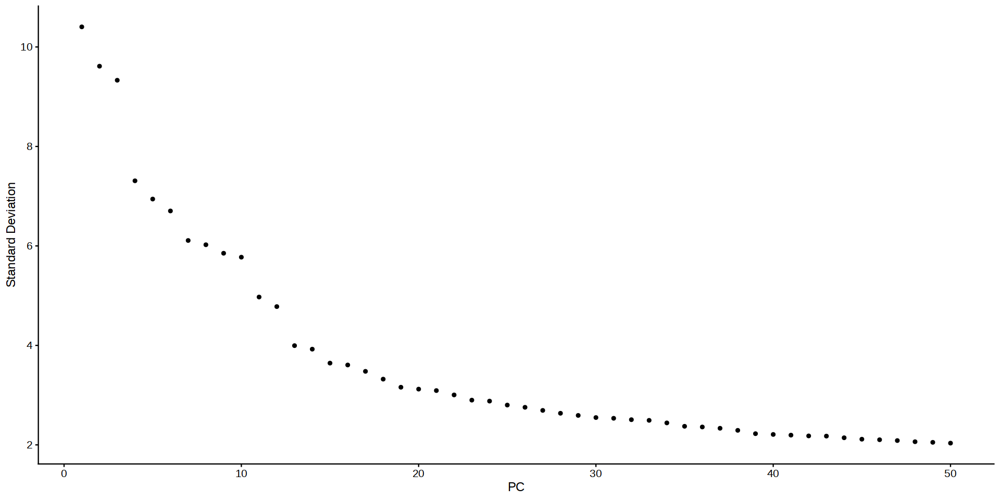

In [8]:
ElbowPlot(A, 50)

In [9]:
A <- FindNeighbors(A, dims = 1:25)
A<- FindClusters(A, resolution = 0.8)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 947
Number of edges: 24247

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8711
Number of communities: 13
Elapsed time: 0 seconds


In [10]:
A <- RunUMAP(A, dims = 1:25, n.neighbors = 12, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


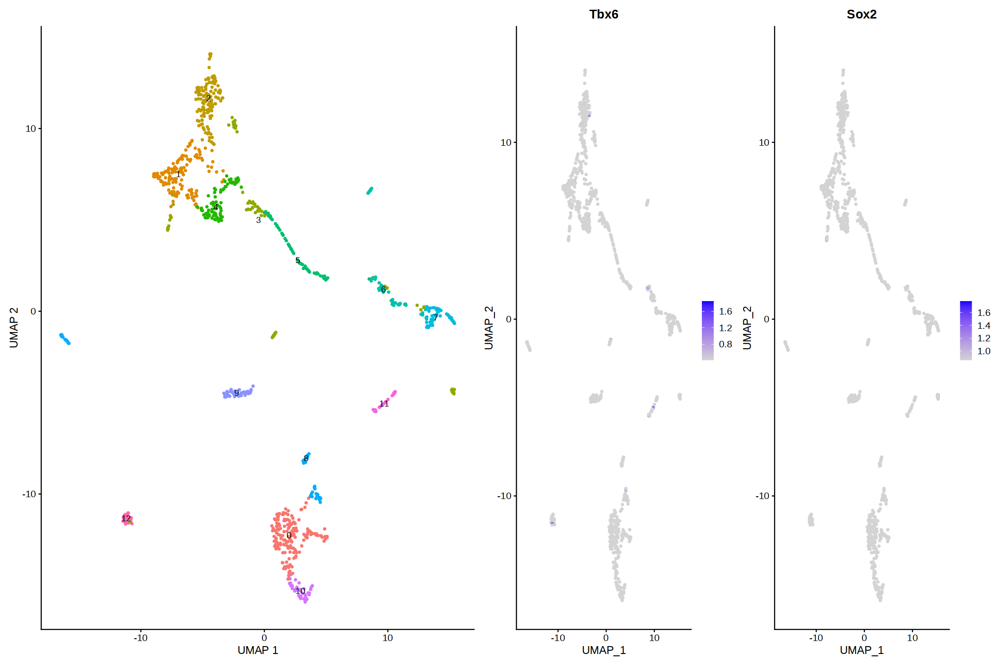

In [11]:
### Check annotation

# Paraxial Mesoderm: Tbx6+, Sox2-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Tbx6", "Sox2"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Wt1, Pax2”
Warning message in FeaturePlot(A, c("Osr1", "Wt1", "Pax2", "Ren1"), min.cutoff = "q1"):
“All cells have the same value (1.17160605457843) of Ren1.”


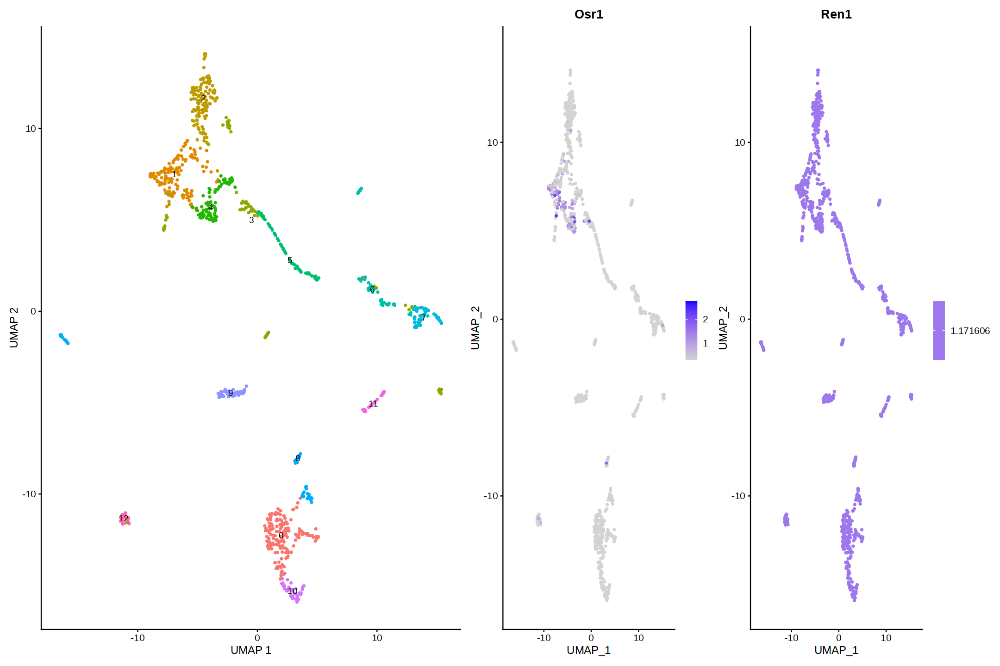

In [12]:
# Intermediate Mesoderm: Osr1, Wt1, Pax2
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Osr1", "Wt1", "Pax2","Ren1"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Hand1, Hand2, Gata4”


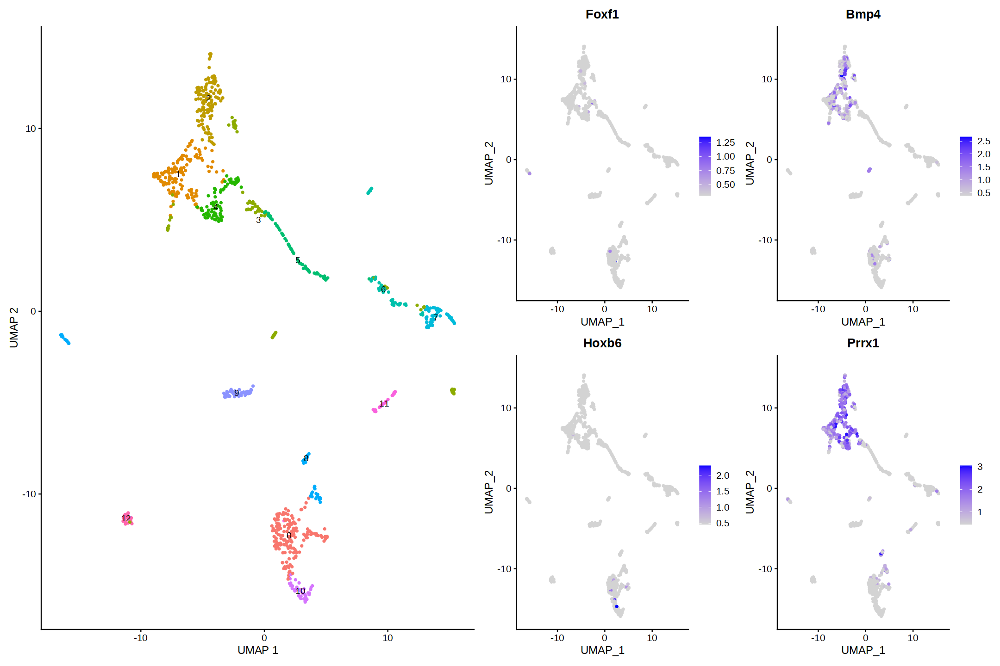

In [14]:
# Lateral plate mesoderm
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Foxf1", "Bmp4", "Hoxb6", "Hand1", "Hand2", "Gata4","Prrx1"), min.cutoff = "q1")  

p1 + p2

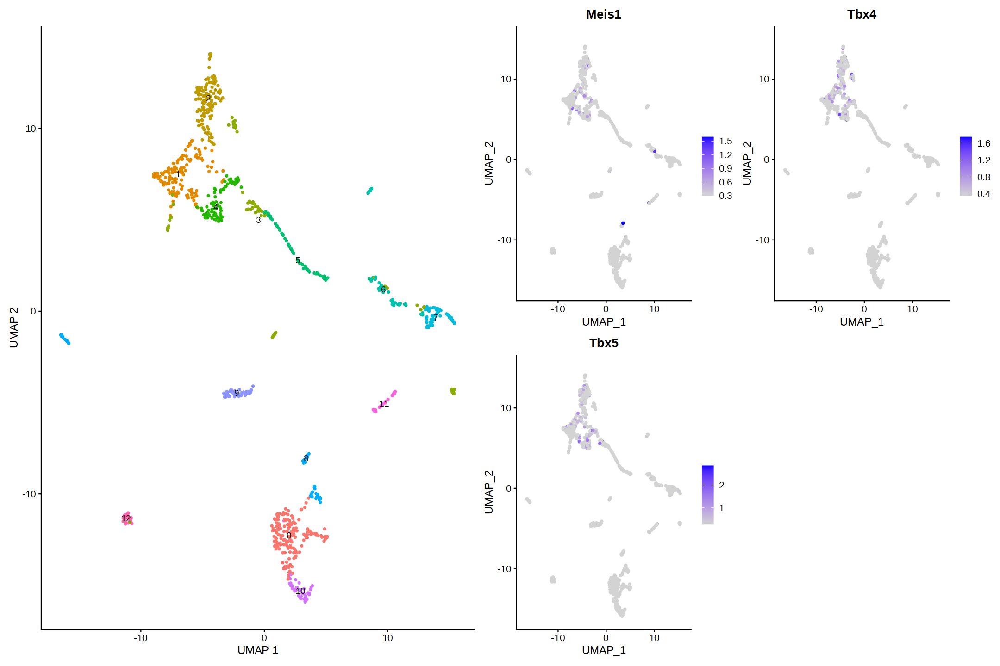

In [15]:
# Early limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Meis1", "Tbx4", "Tbx5"), min.cutoff = "q1")  

p1 + p2

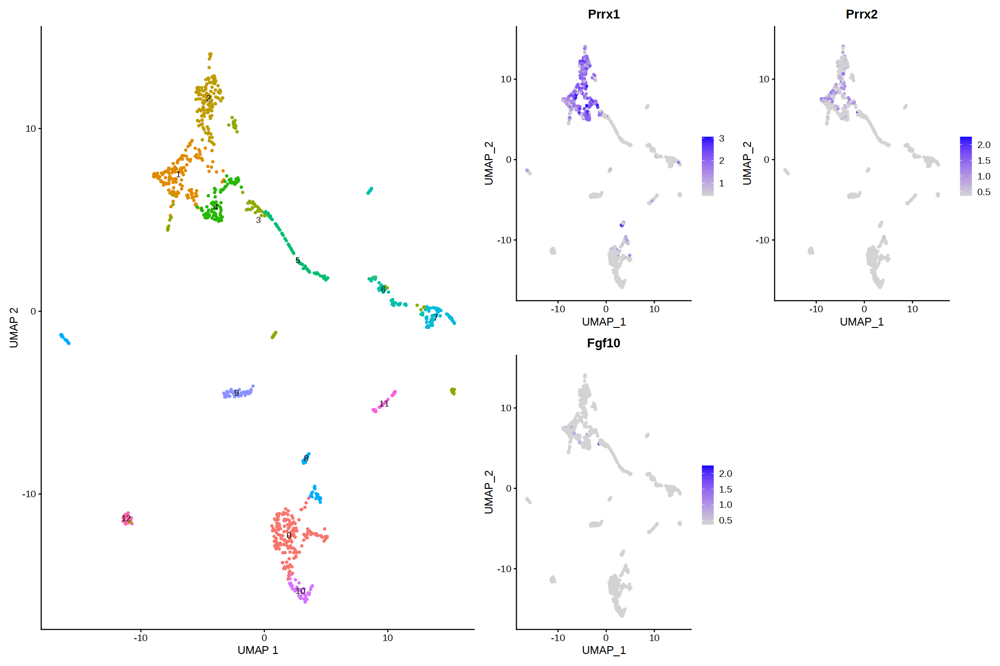

In [16]:
# limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Prrx1", "Prrx2", "Fgf10"), min.cutoff = "q1")  

p1 + p2

In [17]:
# ZPA
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Shh"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Shh”


ERROR: Error: None of the requested features were found: Shh in slot data


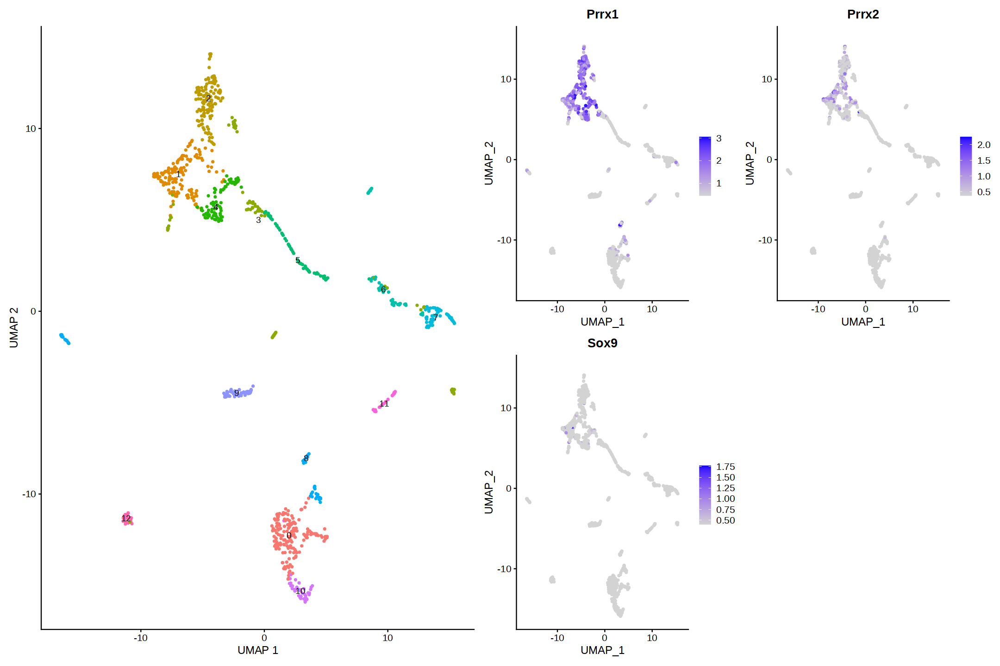

In [18]:
# Chondroprogenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Prrx1", "Prrx2", "Sox9"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Ihh, Col10a1”


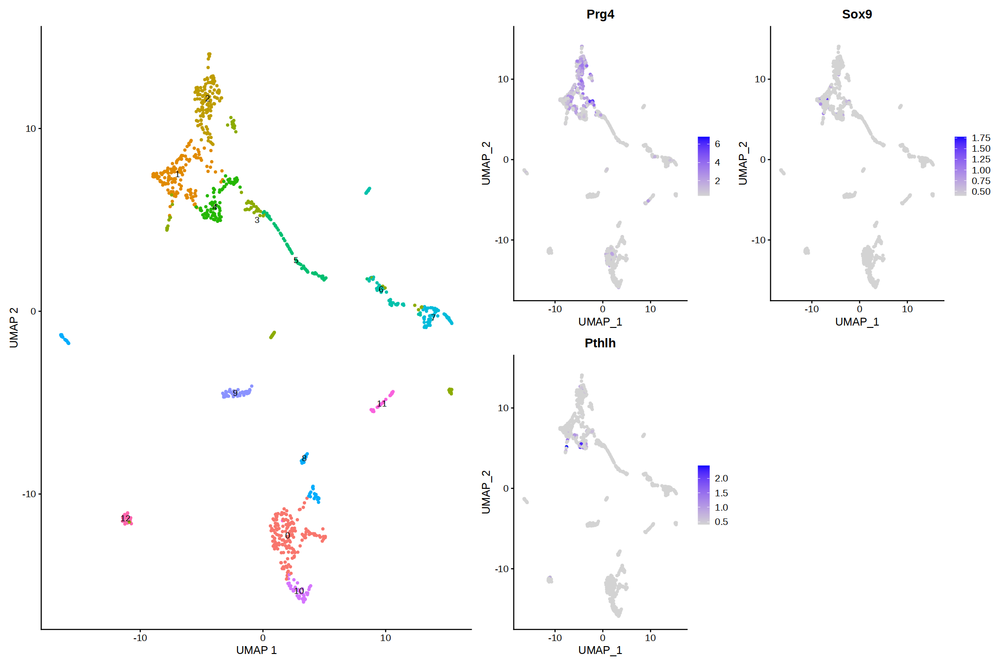

In [19]:
# Chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Prg4","Sox9","Pthlh","Ihh","Col10a1"), min.cutoff = "q1")  

p1 + p2

Warning message in FeaturePlot(A, c("Runx2", "Sp7"), min.cutoff = "q1"):
“All cells have the same value (0.901490497096284) of Sp7.”


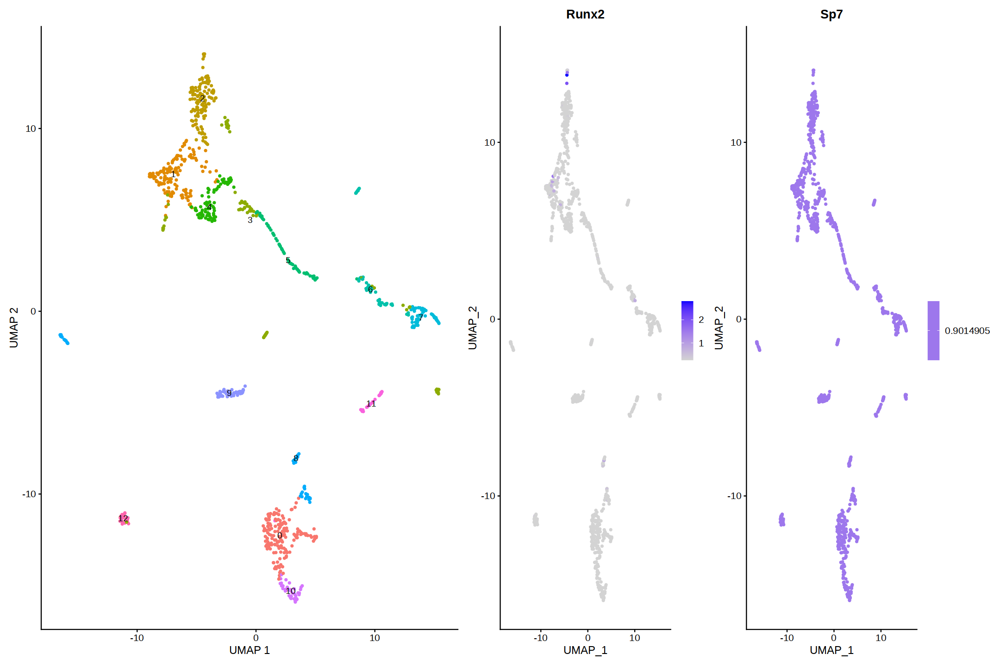

In [20]:
# Osteoprogenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Runx2", "Sp7"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Ocn”


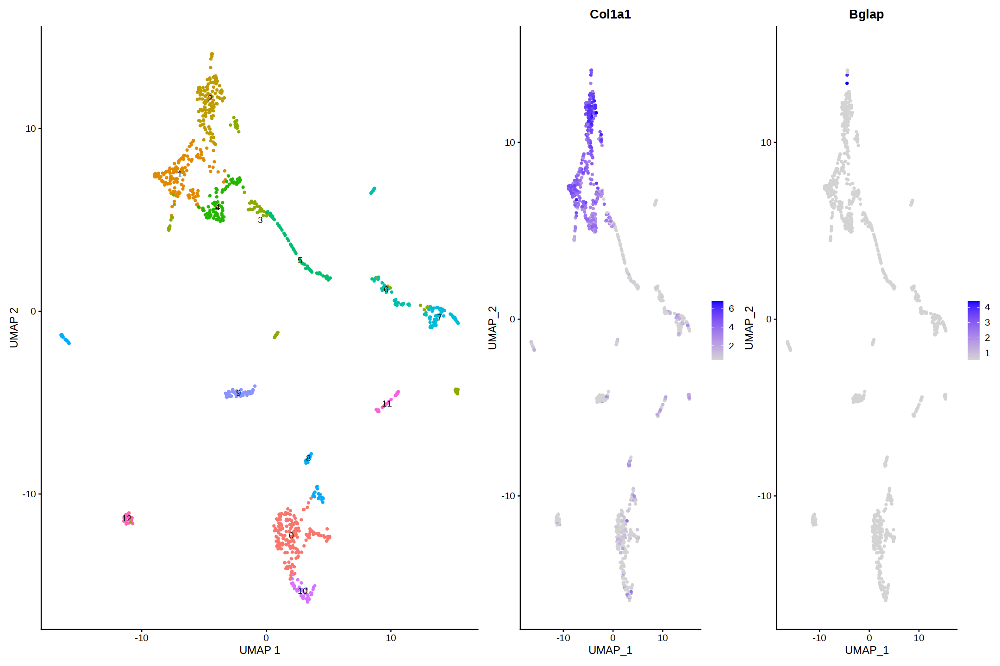

In [21]:
# Osteoblasts
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col1a1", "Bglap", "Ocn"), min.cutoff = "q1")  

p1 + p2

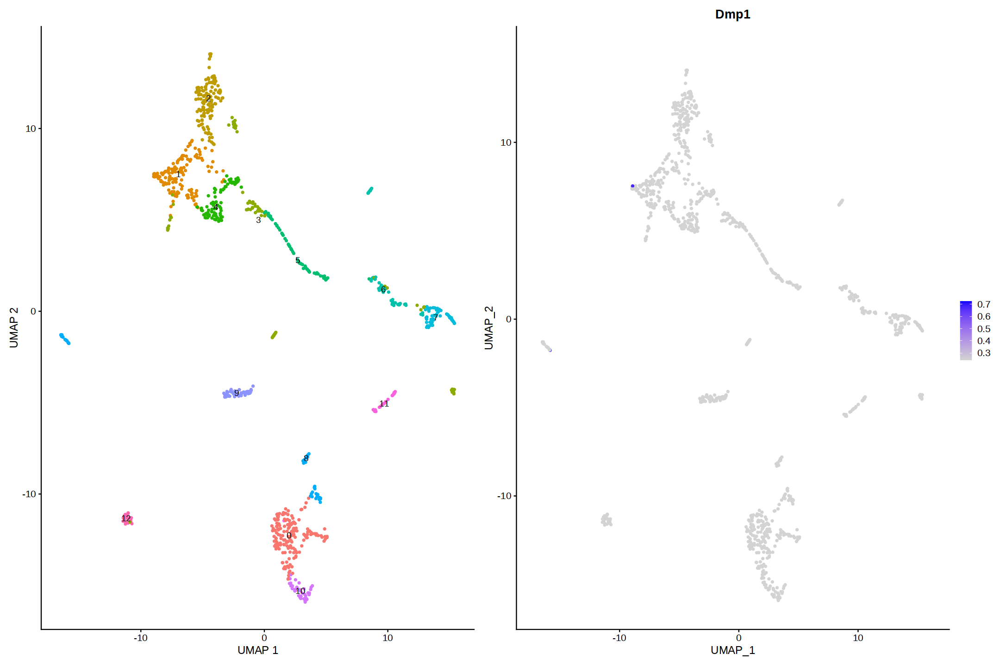

In [23]:
# Osteocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Dmp1"), min.cutoff = "q1")  

p1 + p2

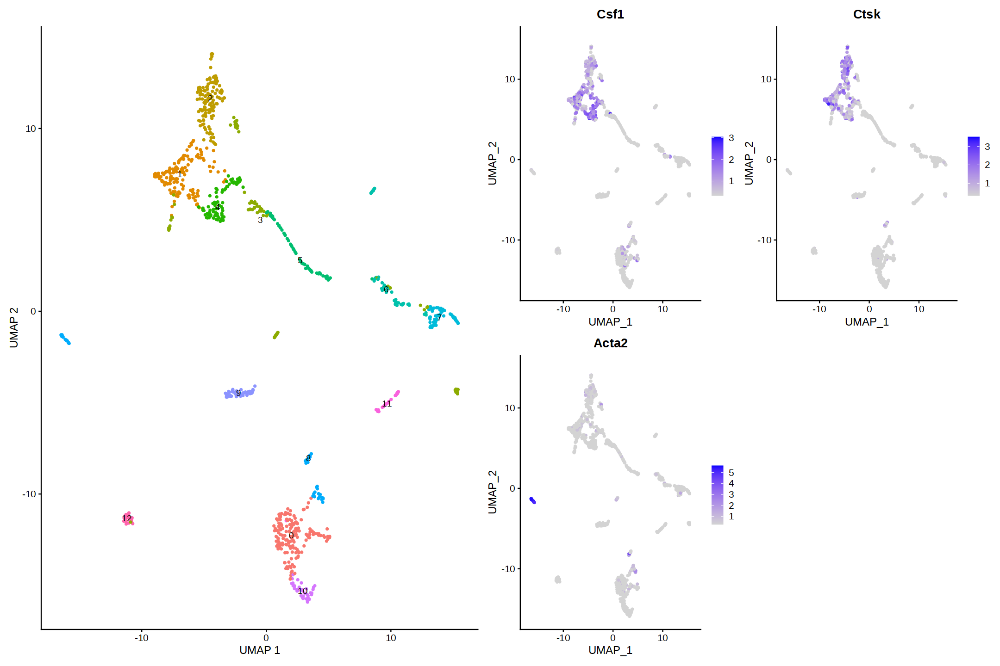

In [25]:
# Osteoclasts
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Csf1", "Ctsk","Acta2"), min.cutoff = "q1")  

p1 + p2

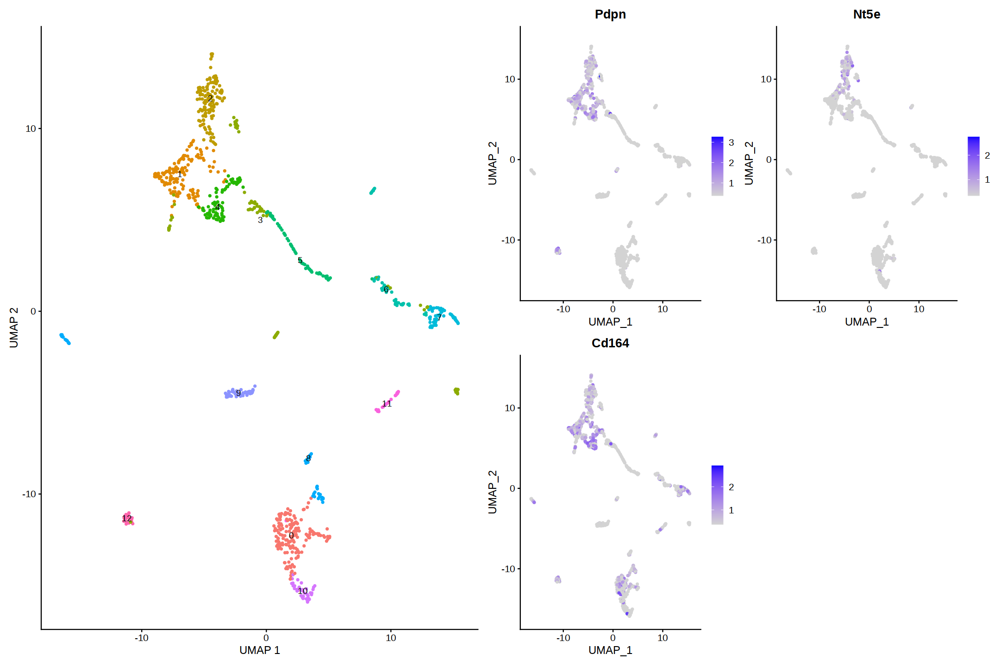

In [26]:
# Periosteal stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pdpn", "Nt5e", "Cd164"), min.cutoff = "q1")  

p1 + p2

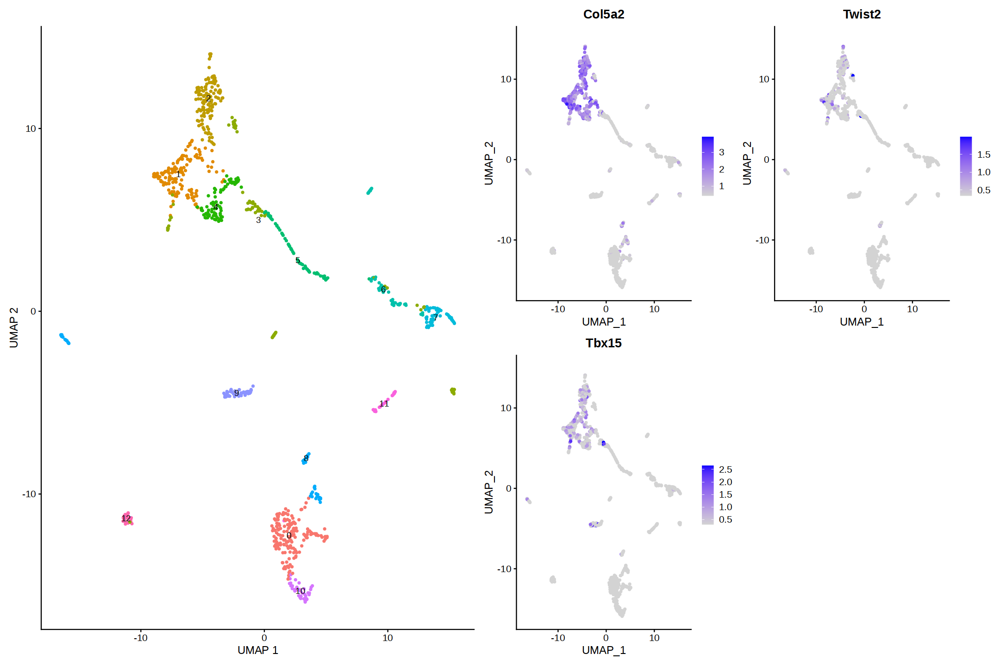

In [27]:
# Periosteal progenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col5a2", "Twist2", "Tbx15"), min.cutoff = "q1")  

p1 + p2

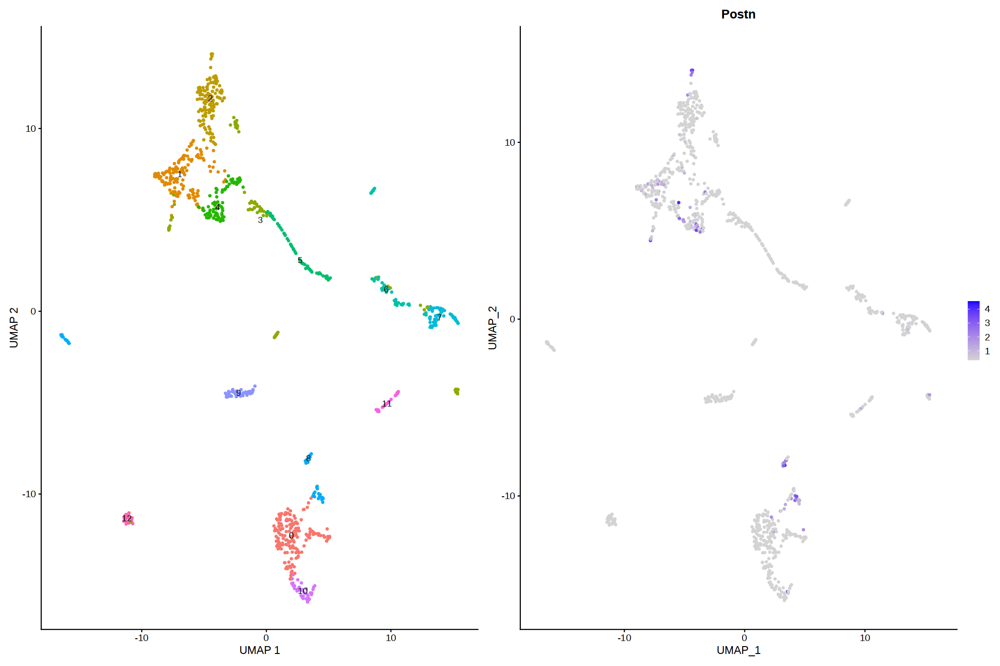

In [28]:
# Periosteum
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Postn"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Gdf5”


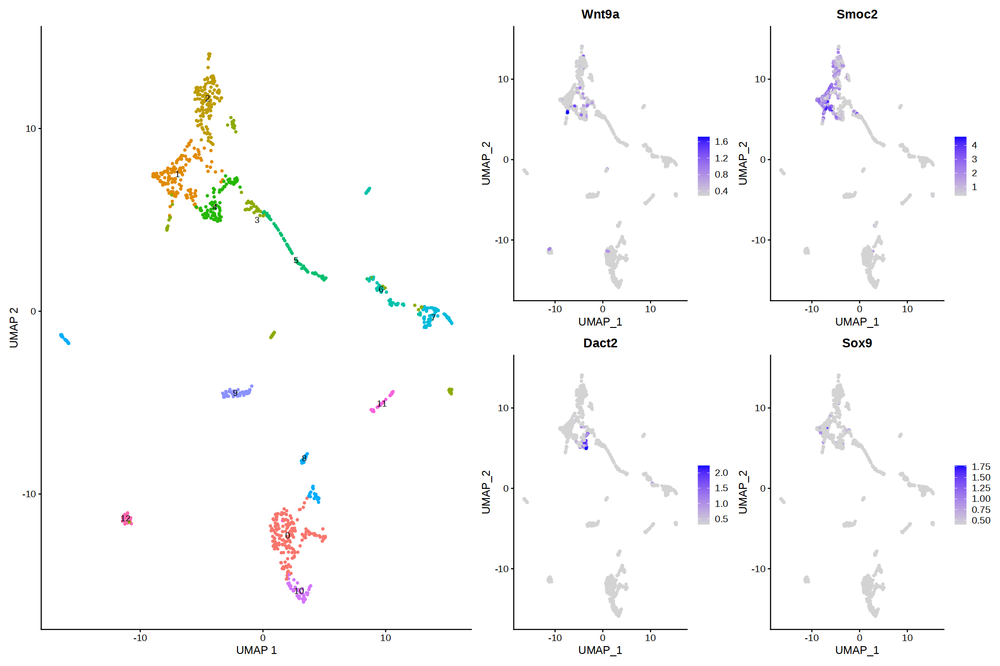

In [29]:
# Joint precursors: sox9-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Gdf5", "Wnt9a", "Smoc2", "Dact2","Sox9"), min.cutoff = "q1")  

p1 + p2

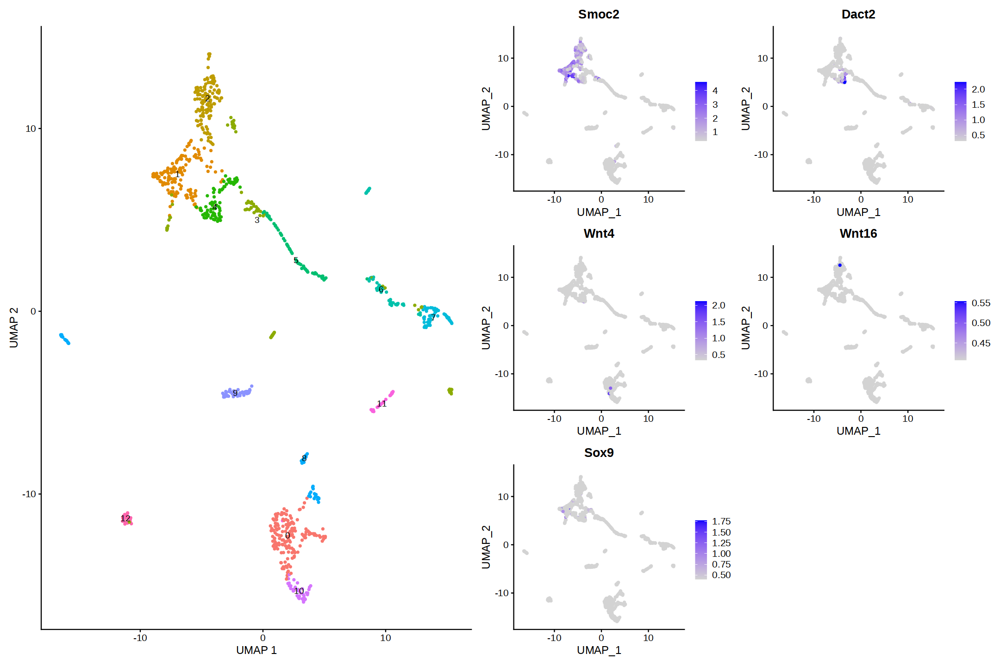

In [30]:
# Interzone cells: sox9-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Smoc2", "Dact2", "Wnt4", "Wnt16","Sox9"), min.cutoff = "q1")  

p1 + p2

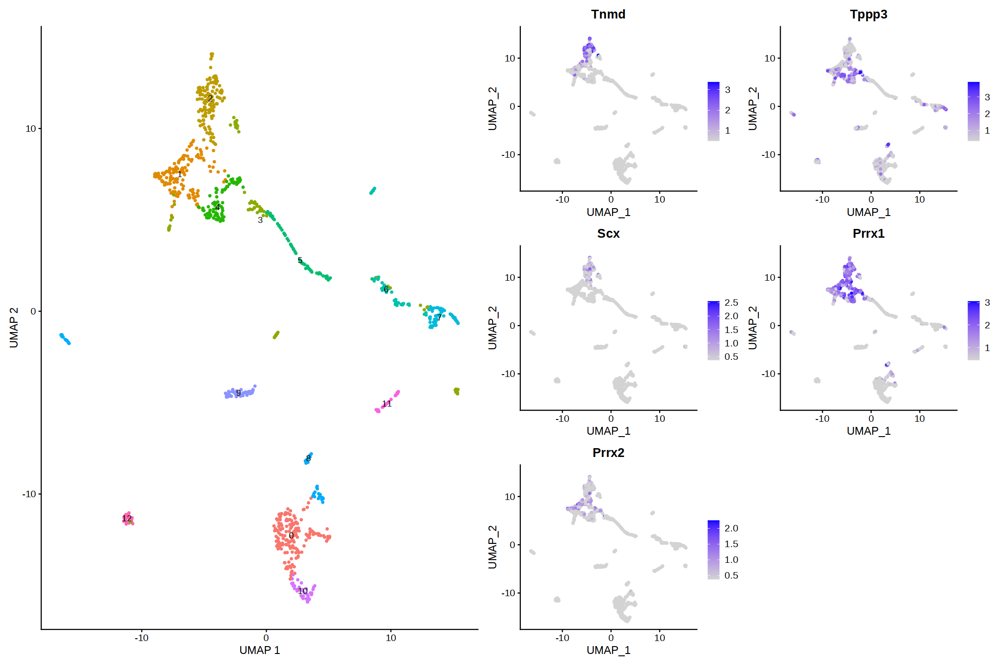

In [31]:
# Tenocyte precursors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Tnmd", "Tppp3", "Scx", "Prrx1", "Prrx2"), min.cutoff = "q1")  

p1 + p2

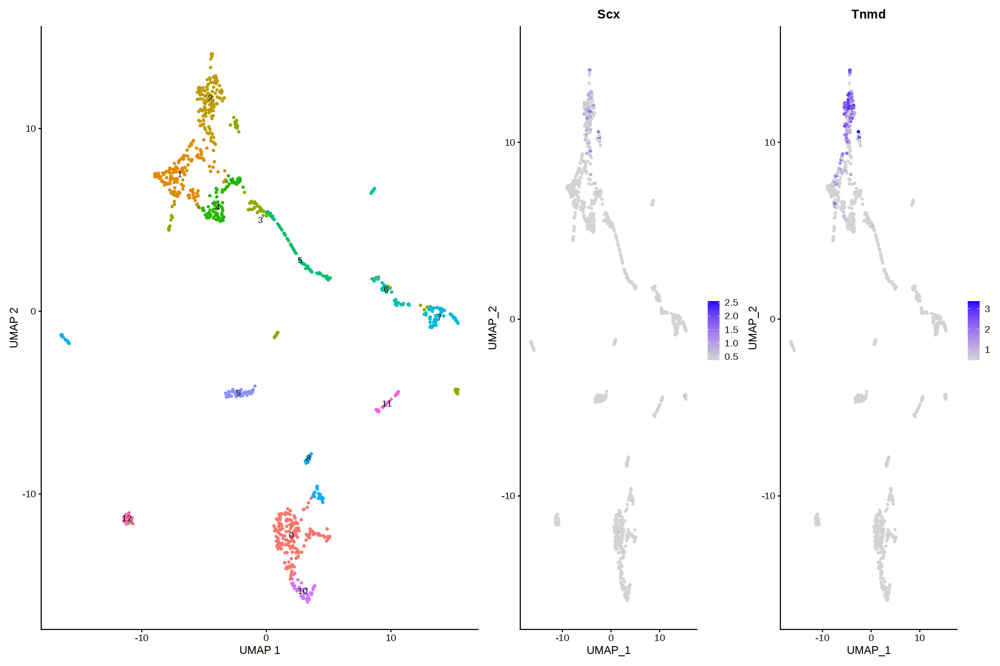

In [32]:
# Tenocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Scx", "Tnmd"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Dkk1, Dra, Hla”


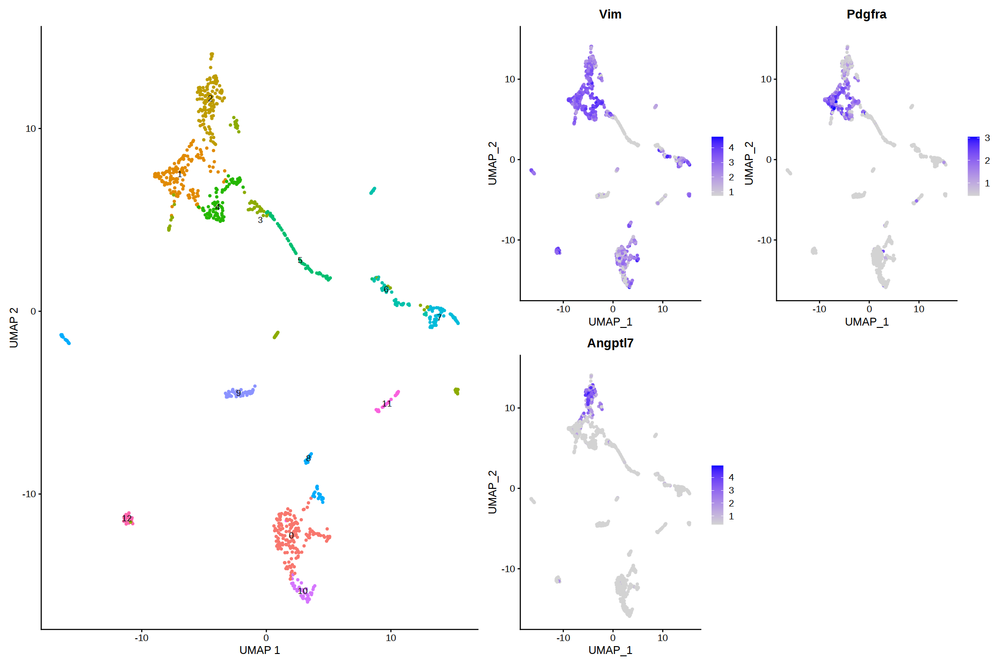

In [33]:
# Synovial fibroblasts: Hla-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Dkk1", "Dra","Hla","Vim","Pdgfra","Angptl7"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Pax3”


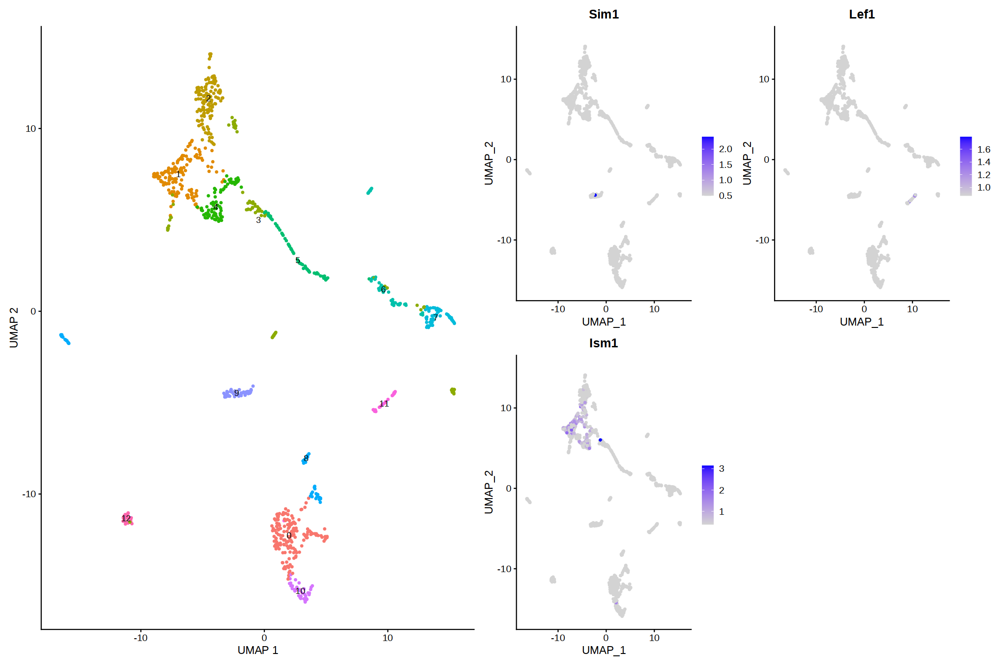

In [34]:
# Dermomyotome
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Sim1", "Pax3", "Lef1", "Ism1"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Myhc, Mrf4, Tnnt2”


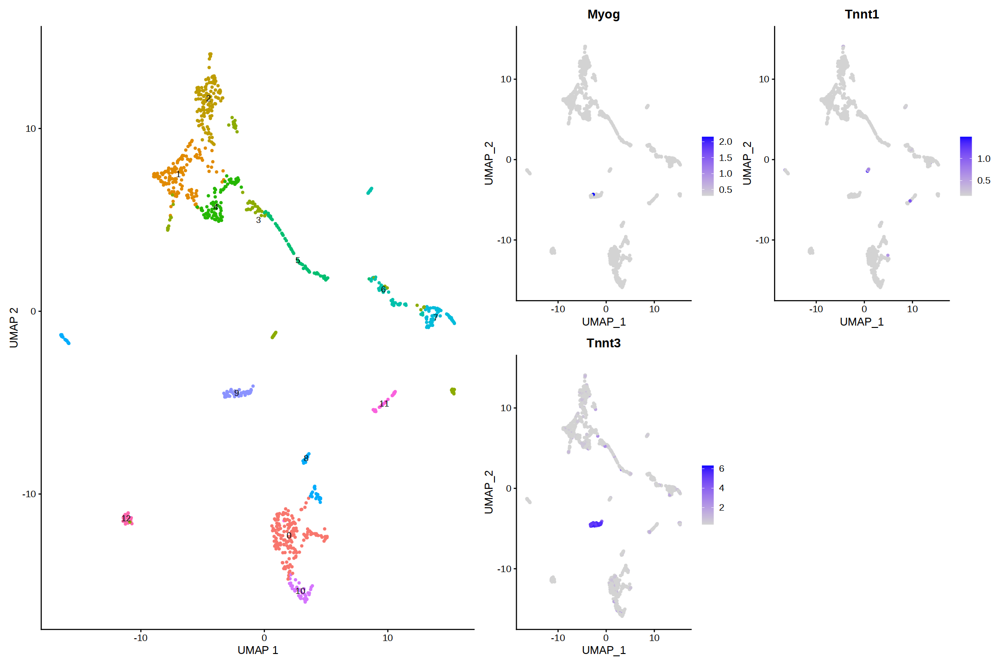

In [35]:
# Skeletal muscle cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Myhc", "Mrf4","Myog",'Tnnt1','Tnnt2','Tnnt3'), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Myod”


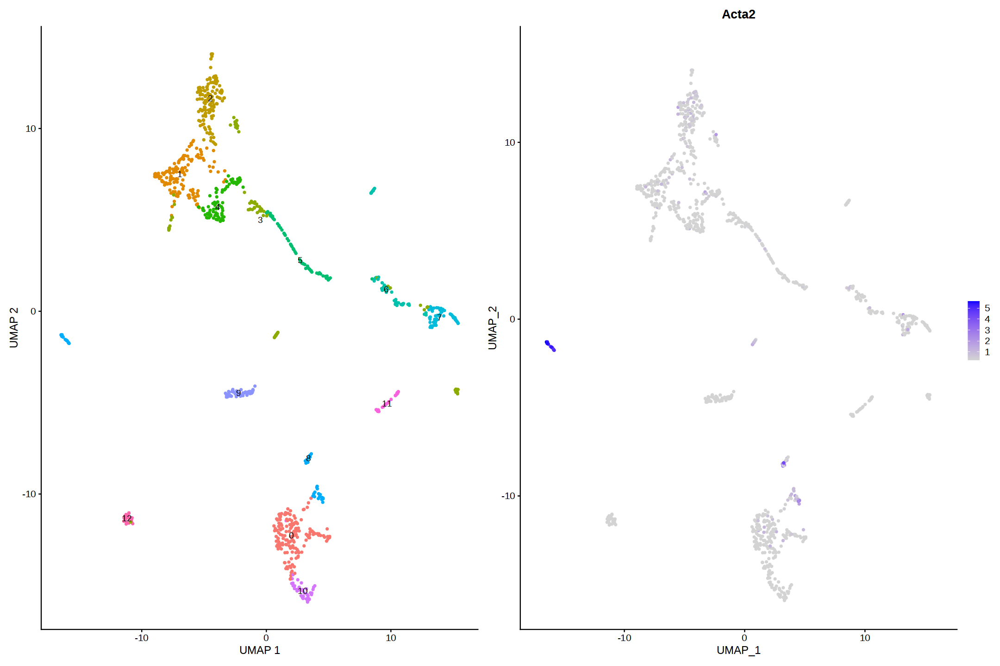

In [36]:
# Smooth muscle cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Acta2","Myod"), min.cutoff = "q1")  

p1 + p2

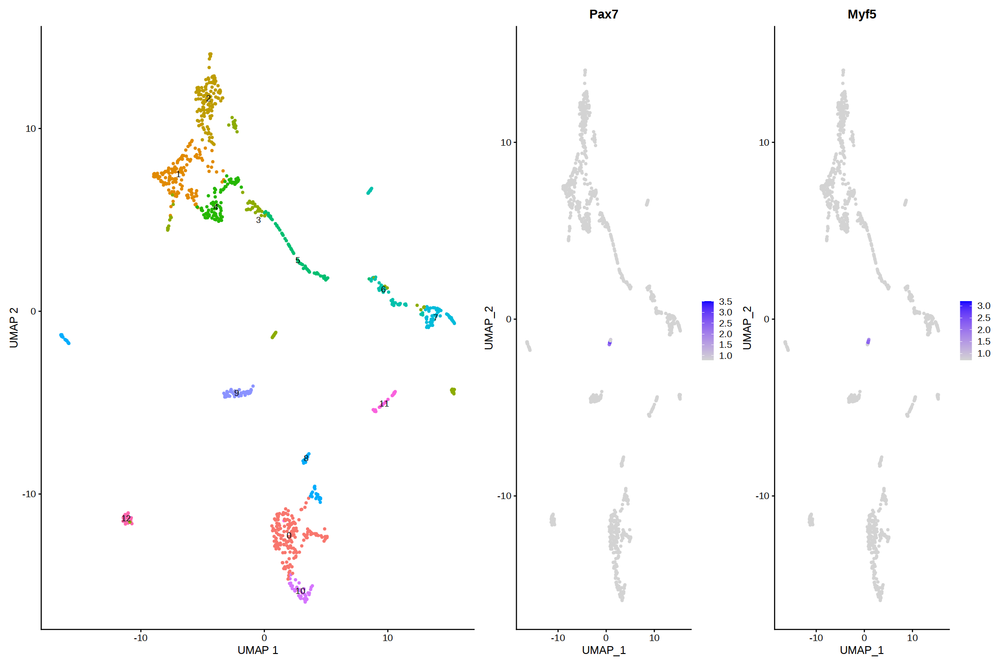

In [37]:
# Myogenic stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pax7","Myf5"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Notch, Pax3, Myod”


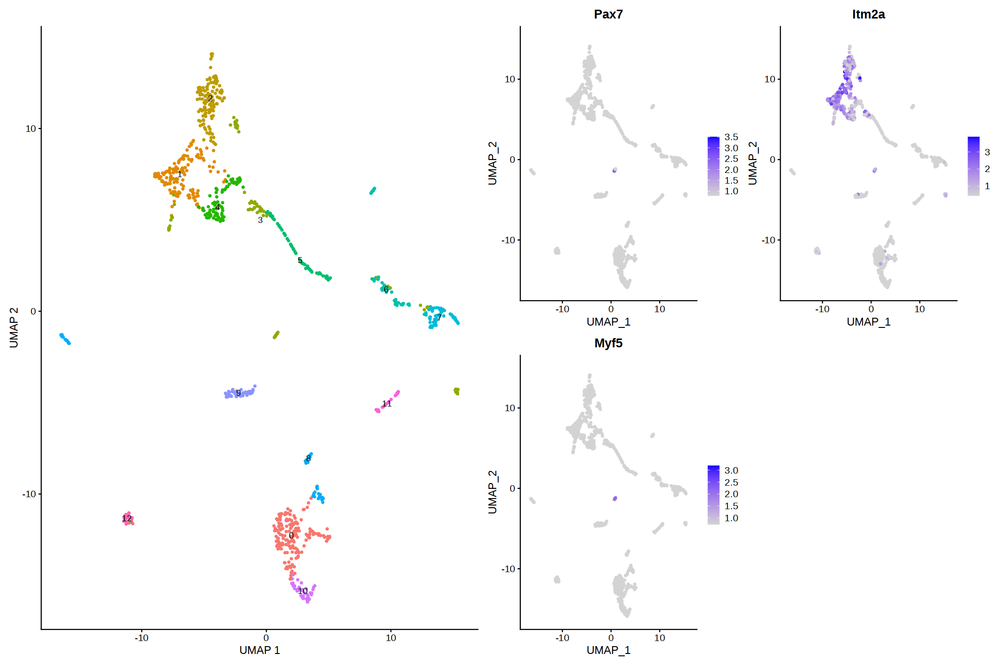

In [38]:
# Muscle progenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pax7", "Notch", "Itm2a", "Myf5", "Pax3", "Myod"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Tnnt2”


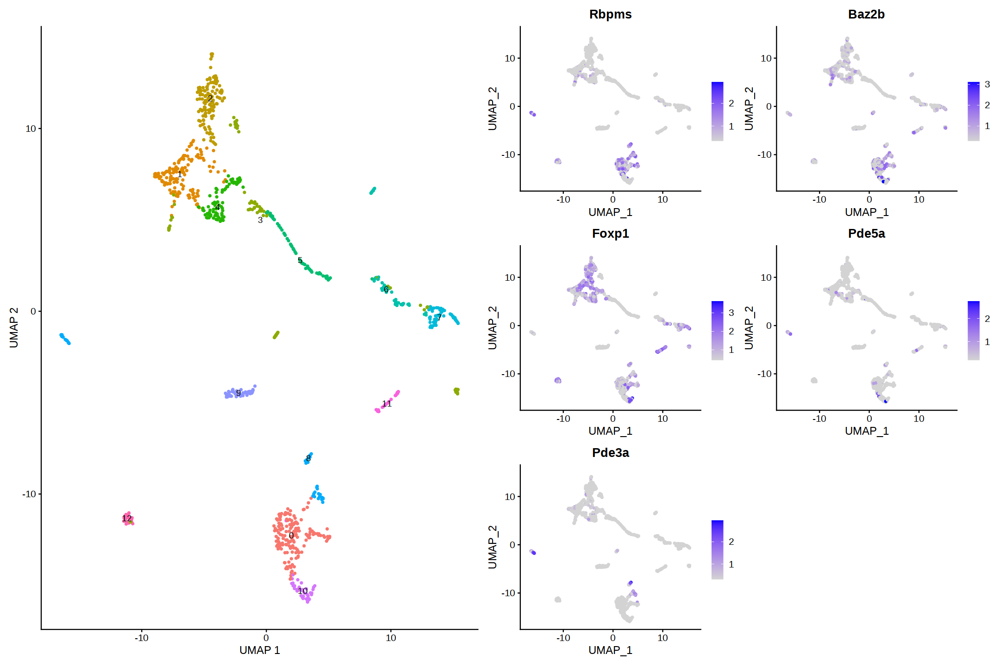

In [39]:
# Cardiomyocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Rbpms", "Baz2b", "Foxp1", "Pde5a", "Pde3a","Tnnt2"), min.cutoff = "q1")  

p1 + p2

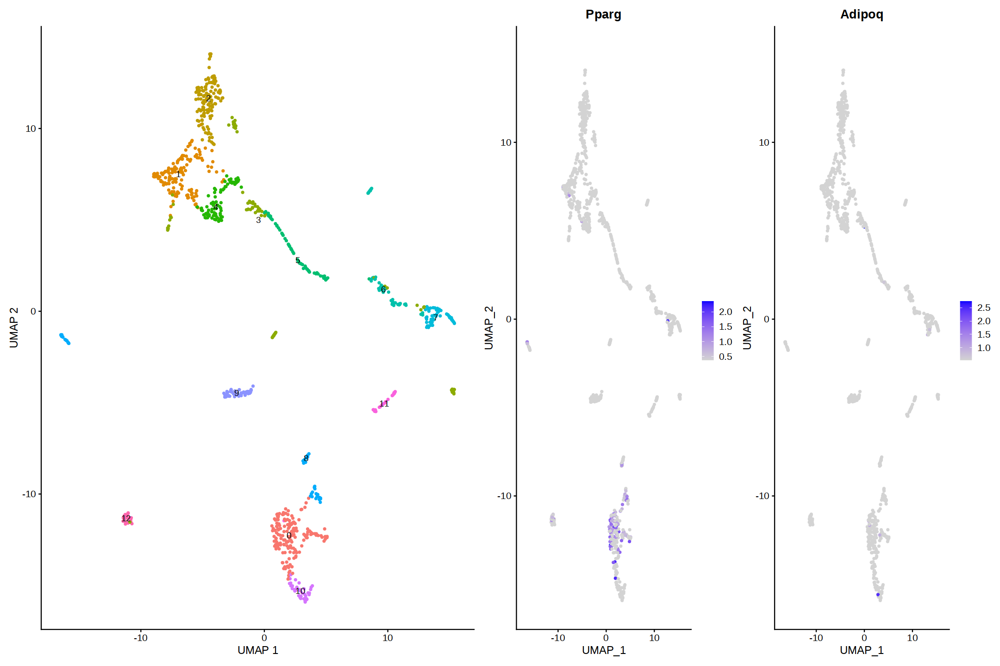

In [40]:
# Adipocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pparg", "Adipoq"), min.cutoff = "q1")  

p1 + p2

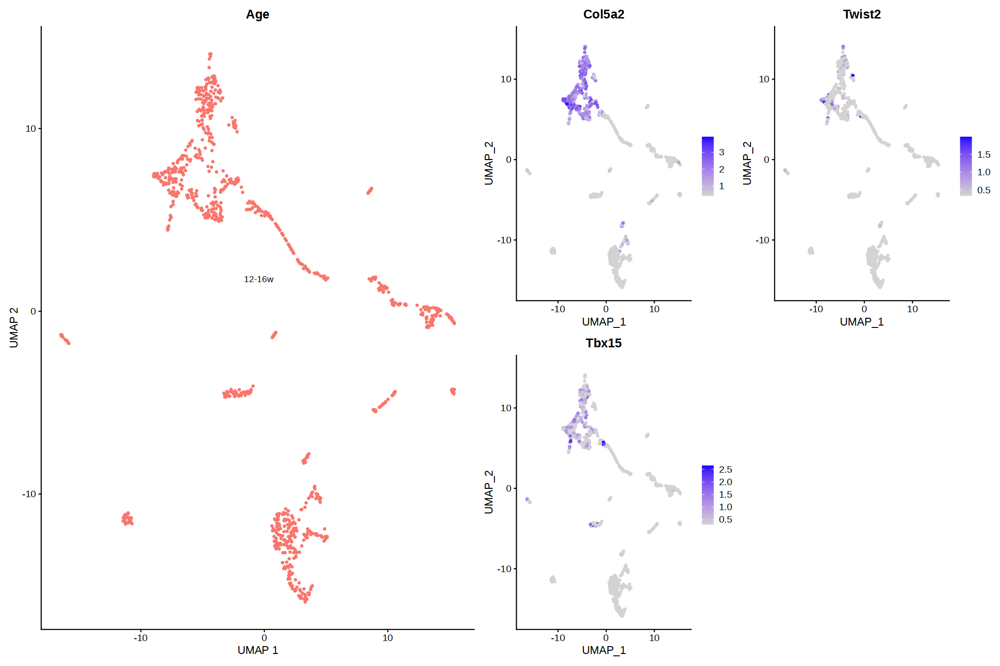

In [41]:
# Perichondrium
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, group.by= "Age", label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col5a2", "Twist2", "Tbx15"), min.cutoff = "q1")  

p1 + p2

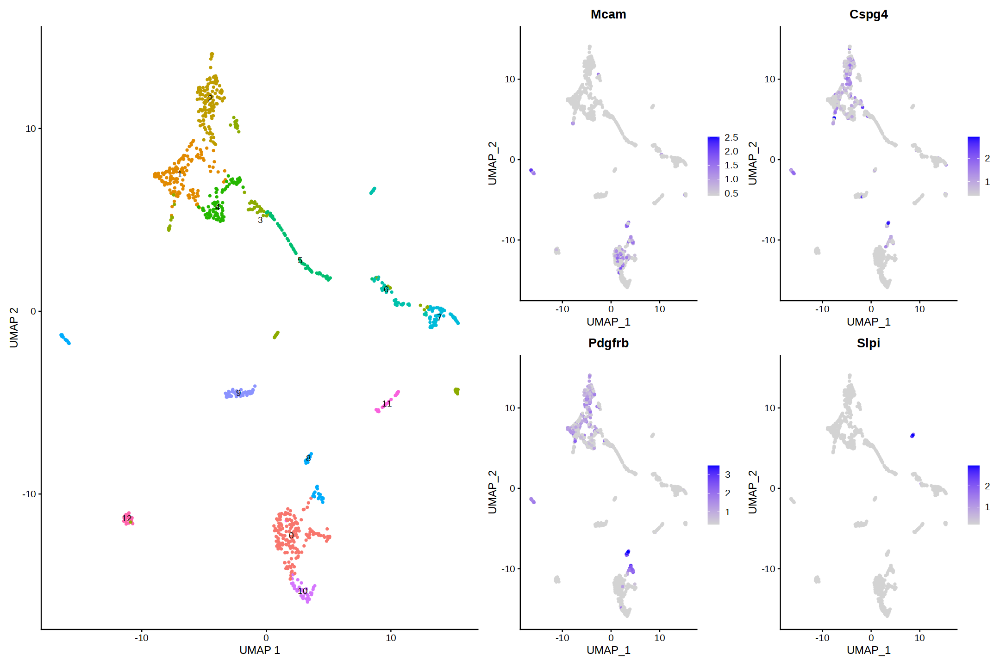

In [42]:
# Pericytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Mcam", "Cspg4", "Pdgfrb", "Slpi"), min.cutoff = "q1")  

p1 + p2

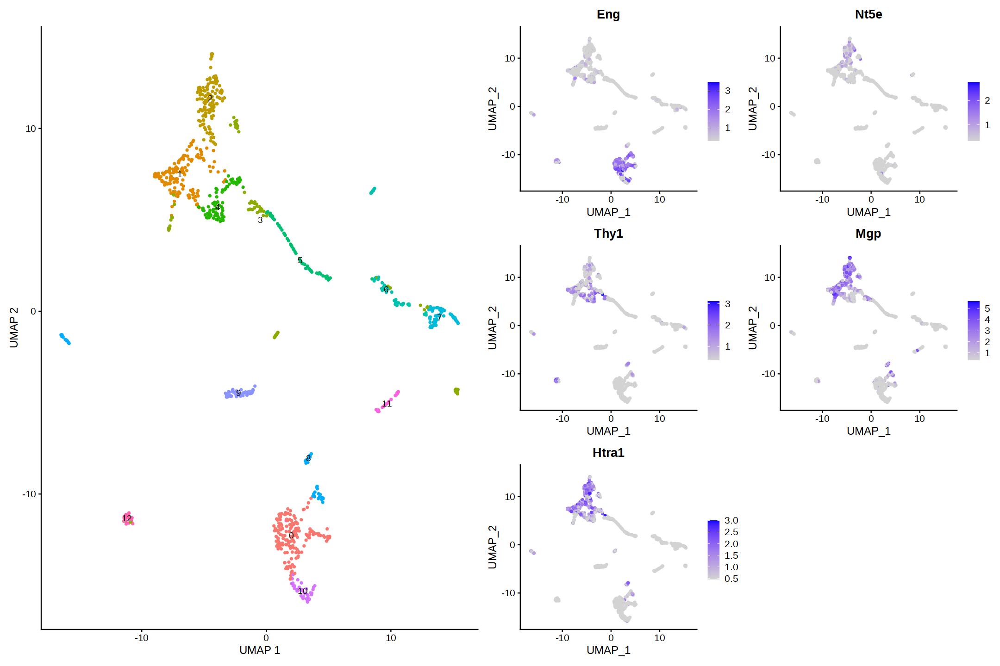

In [43]:
# BMSC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A,, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Eng", "Nt5e", "Thy1", "Mgp","Htra1"), min.cutoff = "q1")  

p1 + p2

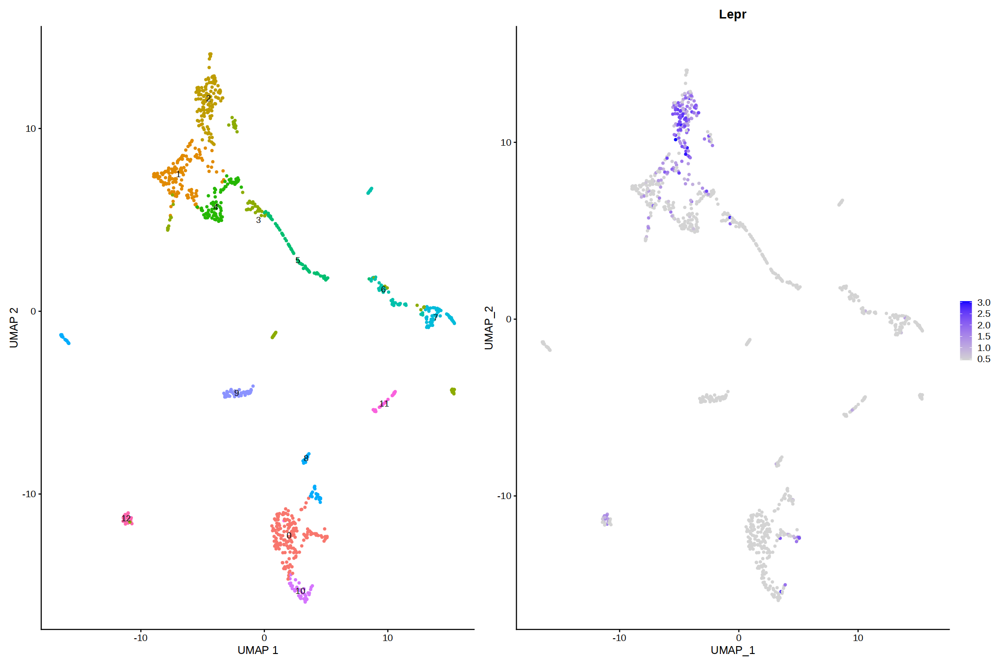

In [44]:
# LepR+ BMSC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Lepr"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Sca1”


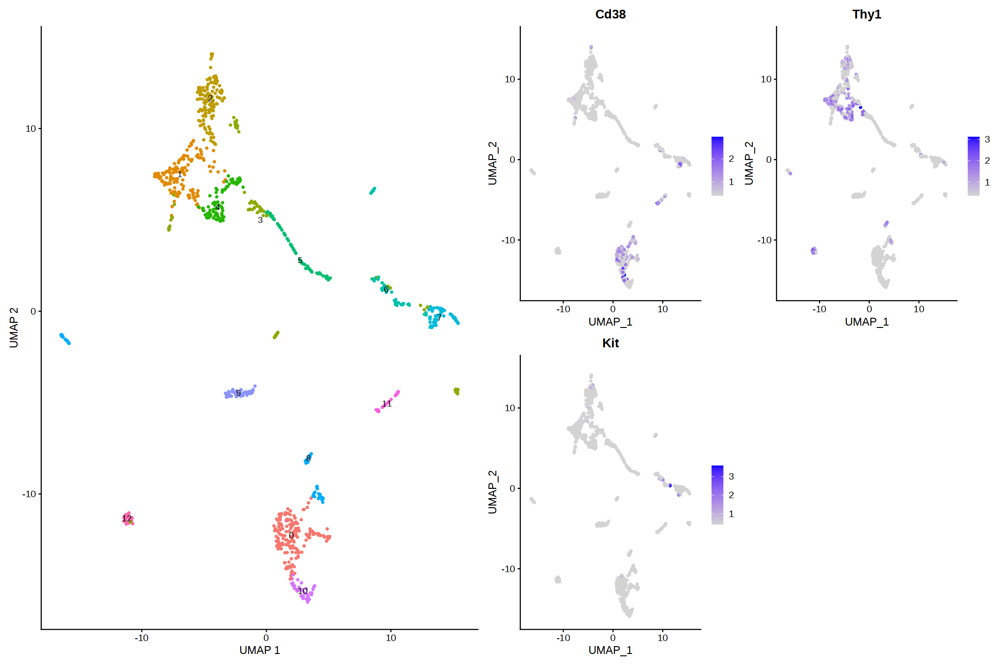

In [45]:
# Hematopoetic stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cd38", "Thy1", "Kit", "Sca1"), min.cutoff = "q1")  

p1 + p2

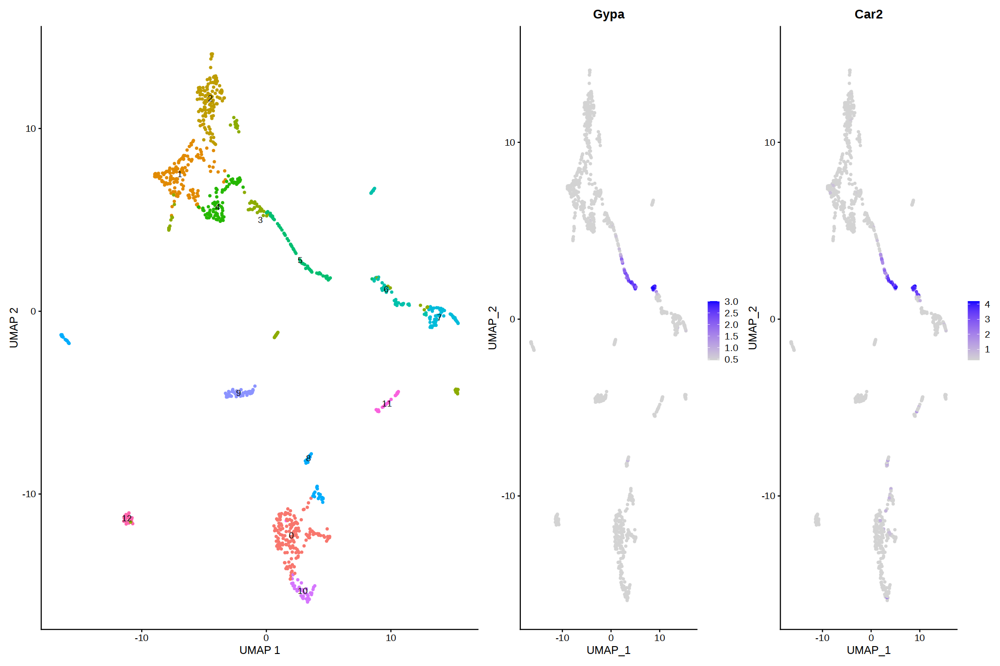

In [46]:
# Erythroid cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Gypa","Car2"), min.cutoff = "q1")  

p1 + p2

In [77]:
# Platelets
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE, group.by="CellType") + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("F2rl2", "F5"), min.cutoff = "q1")  

p1 + p2

ERROR: Error: Cannot find 'CellType' in this Seurat object


Warning message in FeaturePlot(A, c("Vwf", "Pf4", "Gata1", "Selp", "Gp6", "Gp1ba"), :
“All cells have the same value (0.910184524800963) of Gp1ba.”


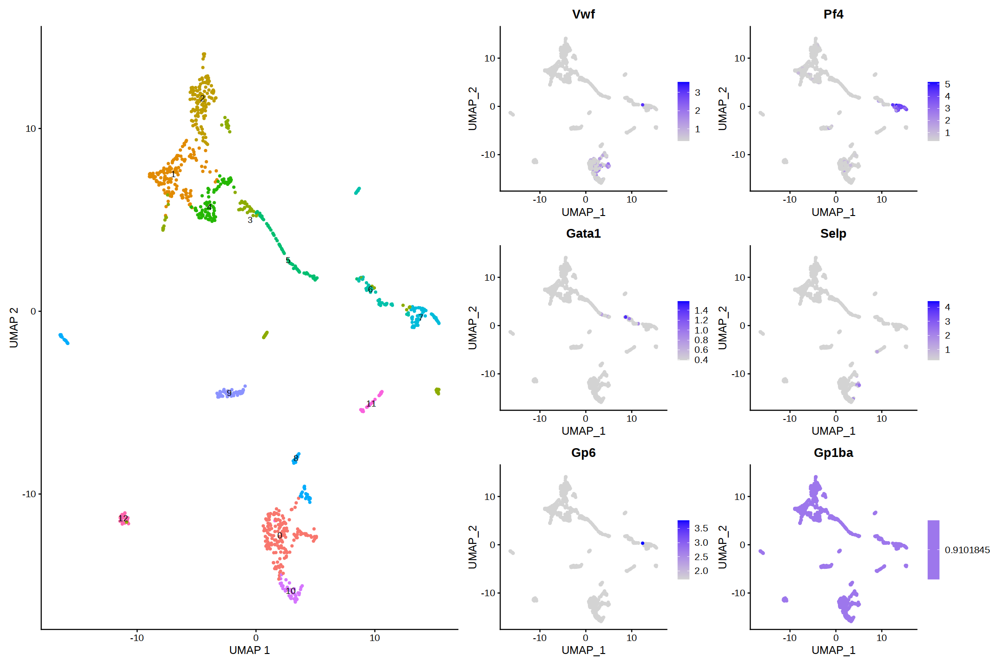

In [47]:
# Megakaryocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Vwf", "Pf4", "Gata1", "Selp", "Gp6", "Gp1ba"), min.cutoff = "q1")  

p1 + p2

Warning message in FeaturePlot(A, c("Cd3g", "Cd19", "Cd68", "Cxcr2", "Mrc1", "Flt3"), :
“All cells have the same value (2.925739039388) of Cd3g.”


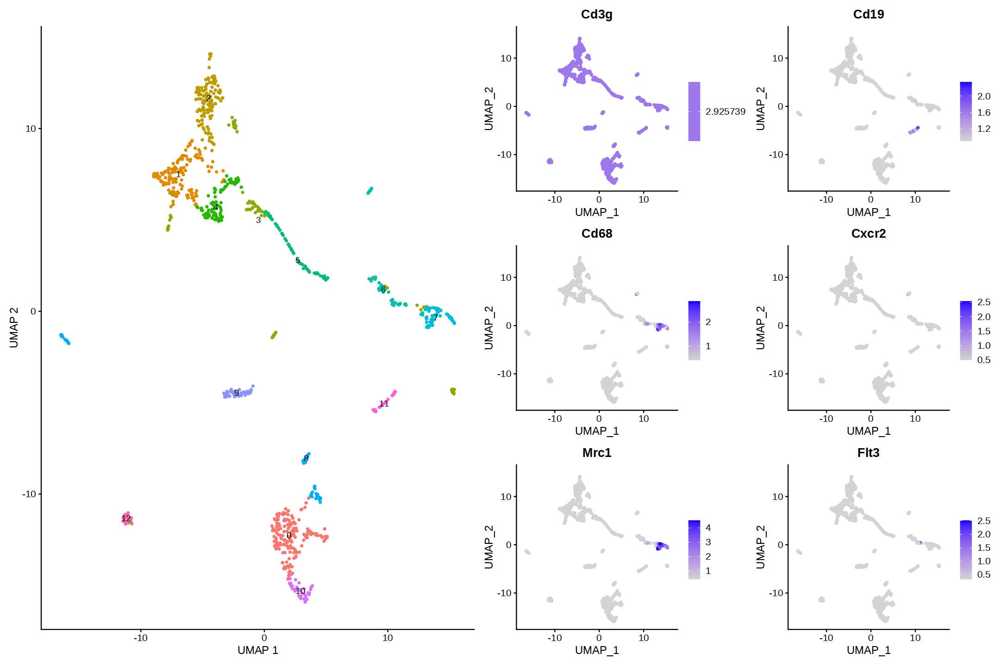

In [48]:
# Immune cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cd3g", "Cd19", "Cd68", "Cxcr2","Mrc1","Flt3"), min.cutoff = "q1")  

p1 + p2

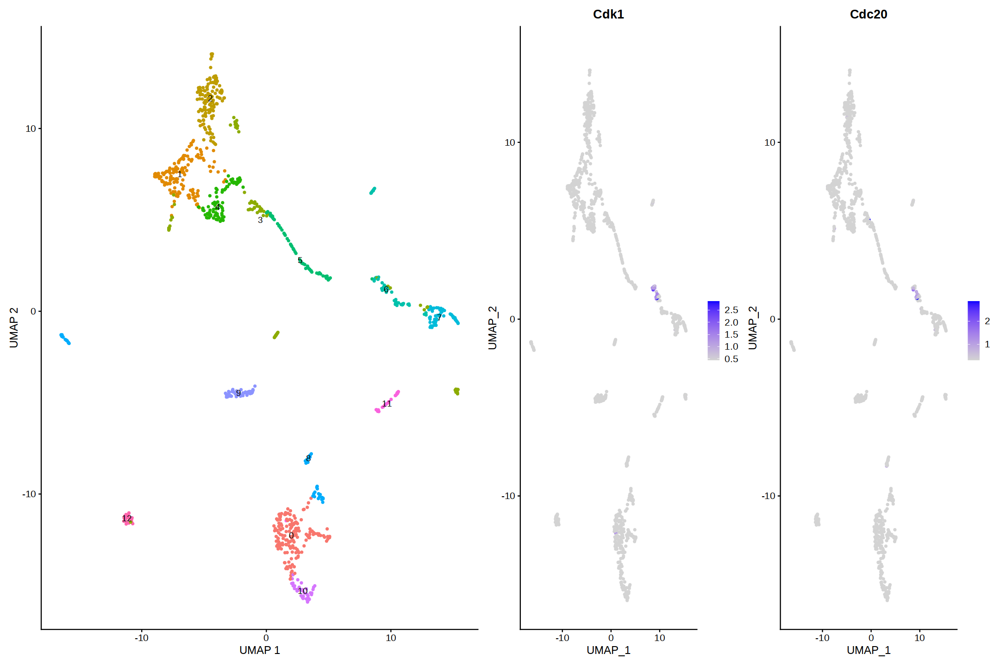

In [55]:
# Fast proliferating cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cdk1","Cdc20"), min.cutoff = "q1")  

p1 + p2

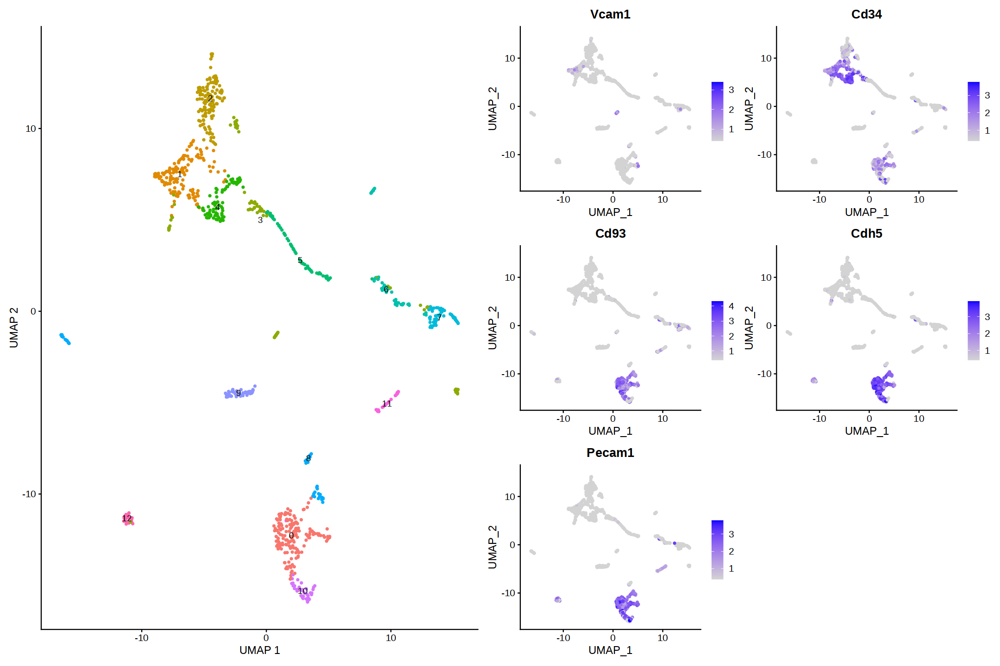

In [49]:
# Vascular endothelial cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Vcam1", "Cd34", "Cd93", "Cdh5","Pecam1"), min.cutoff = "q1")  

p1 + p2

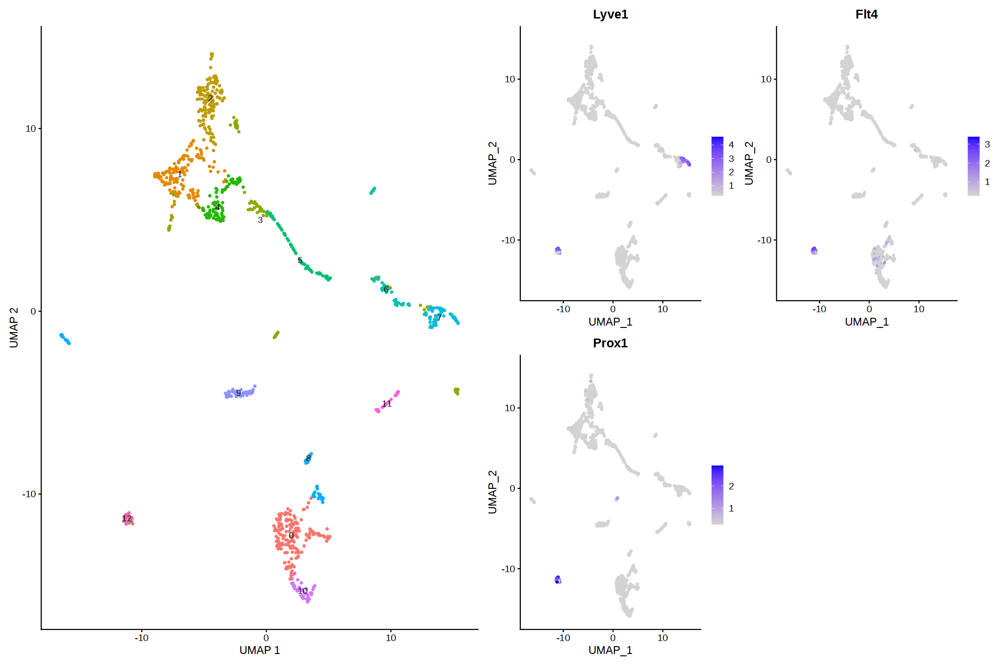

In [50]:
# Lymphatic endothelial cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Lyve1", "Flt4", "Prox1"), min.cutoff = "q1")  

p1 + p2

In [ ]:
A$

In [51]:
# Apical ectodermal ridge
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Fgf8",  "Rspo"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Fgf8, Rspo”


ERROR: Error: None of the requested features were found: Fgf8, Rspo in slot data


Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Wnt7a, Pax6”


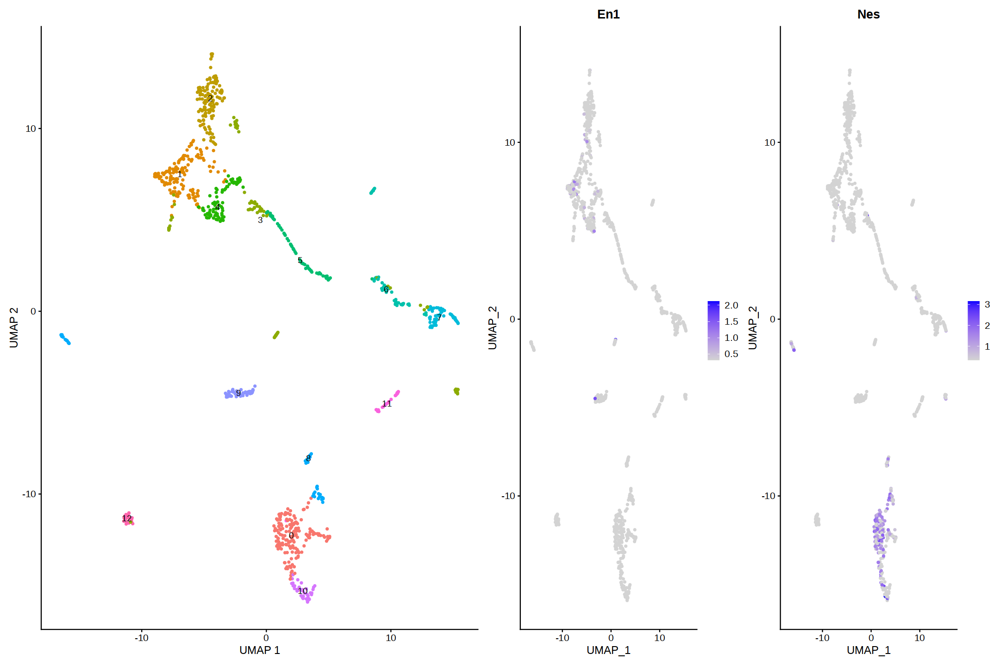

In [52]:
# Ectoderm
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Wnt7a", "En1", "Nes", "Pax6"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Nefl”


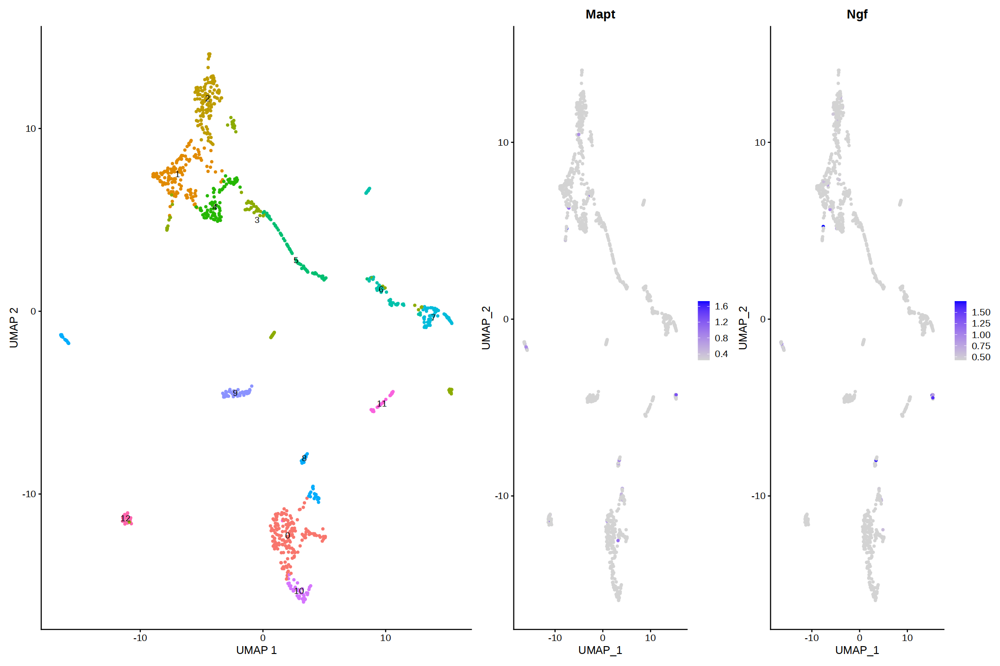

In [53]:
# Neurons
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Nefl", "Mapt","Ngf"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Krt5”


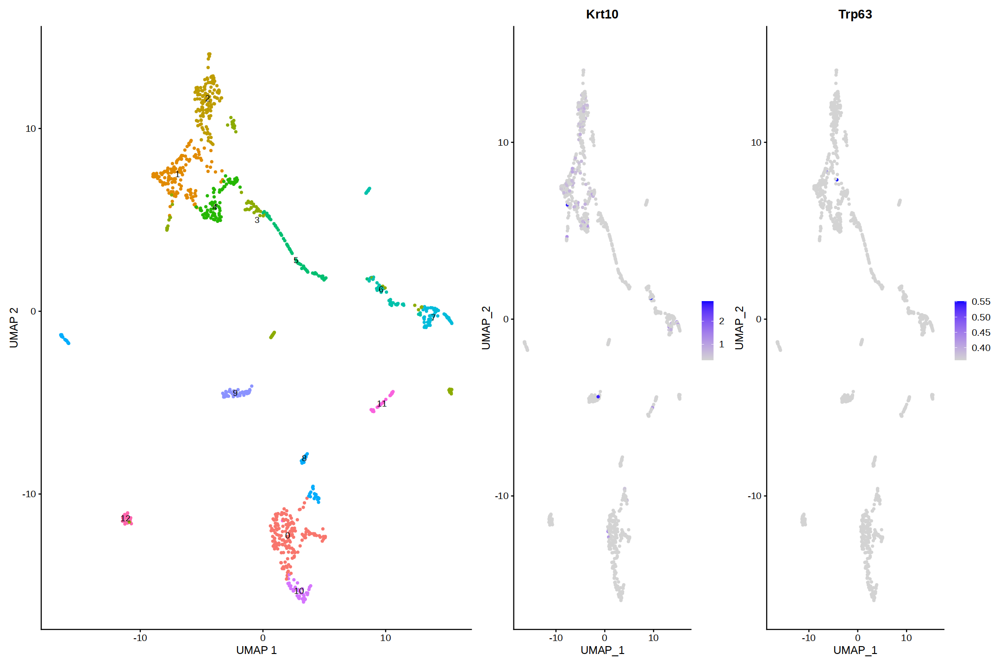

In [54]:
# Skin
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Krt5", "Krt10", 'Trp63'), min.cutoff = "q1")  

p1 + p2

### 3.4. Differential expression analysis<a id="12"></a>
#### 3.4.1. Global annotation by differential expression analysis<a id="13"></a>

Seurat identifies markers that define clusters via differential expression. By default, it identifes positive and negative markers of a single cluster (specified in ident.1), compared to all other cells. `FindAllMarkers` automates this process for all clusters, but it is possible to test groups of clusters vs. each other, or against all cells.

The `min.pct` argument requires a feature to be detected at a minimum percentage in either of the two groups of cells, and the `thresh.test` argument requires a feature to be differentially expressed (on average) by some amount between the two groups. You can set both of these to 0, but with a dramatic increase in time - since this will test a large number of features that are unlikely to be highly discriminatory. As another option to speed up these computations, `max.cells.per.ident` can be set. This will downsample each identity class to have no more cells than whatever this is set to. While there is generally going to be a loss in power, the speed increases can be significiant and the most highly differentially expressed features will likely still rise to the top.

In [56]:
# Seurat default settings
A.markers <- FindAllMarkers(A, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12



In [ ]:
A

In [57]:
#dir.create("./6-kmita/analysis")
write.csv(A.markers, file = "Maerz.markers.csv", quote = FALSE)

**Adding cell types**

In [59]:
A@meta.data$CellType <- NULL

In [60]:
#creating column that contains cell type 
A@meta.data$CellType <- Idents(A)

In [61]:
A@meta.data$CellType <- as.character(A@meta.data$CellType)

A@meta.data$CellType[A@meta.data$CellType == '0'] <- 'Vascular endothelial cells'
A@meta.data$CellType[A@meta.data$CellType == '1'] <- 'Synovial fibroblasts'
A@meta.data$CellType[A@meta.data$CellType == '2'] <- 'Synovial fibroblasts'
A@meta.data$CellType[A@meta.data$CellType == '3'] <- 'Synovial fibroblasts'
A@meta.data$CellType[A@meta.data$CellType == '4'] <- 'Synovial fibroblasts'
A@meta.data$CellType[A@meta.data$CellType == '5'] <- 'Erythroid cells'
A@meta.data$CellType[A@meta.data$CellType == '6'] <- 'Erythroid cells'
A@meta.data$CellType[A@meta.data$CellType == '7'] <- 'Immune cells'
A@meta.data$CellType[A@meta.data$CellType == '8'] <- 'Smooth muscle cells'
A@meta.data$CellType[A@meta.data$CellType == '9'] <- 'Skeletal muscle cells'
A@meta.data$CellType[A@meta.data$CellType == '10'] <- 'Vascular endothelial cells'
A@meta.data$CellType[A@meta.data$CellType == '11'] <- 'Immune cells'
A@meta.data$CellType[A@meta.data$CellType == '12'] <- 'Lymphatic endothelial cells'


A@meta.data$CellType <- as.factor(A@meta.data$CellType)

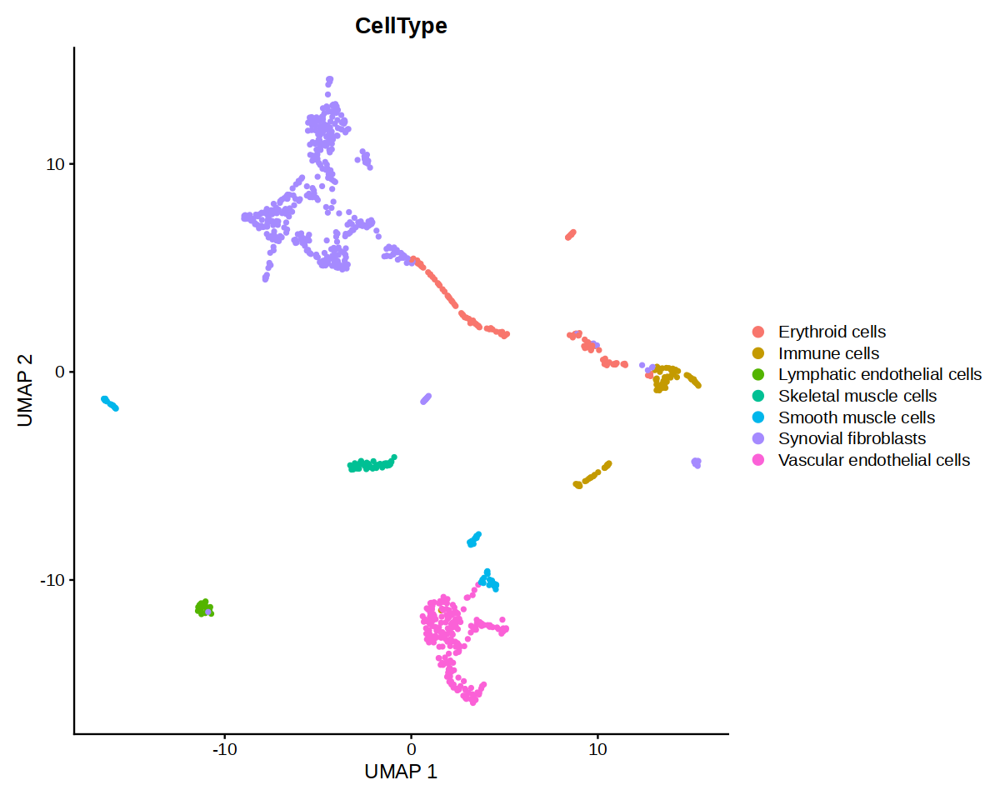

In [62]:
options(repr.plot.width = 10, repr.plot.height = 8)

DimPlot(A, reduction = "umap", label = FALSE, group.by = "CellType") + xlab("UMAP 1") + ylab("UMAP 2")

In [63]:
Idents(A)<-A@meta.data$CellType

#### 3.4.2. Refinement of global annotations<a id="13.2"></a>
##### 3.4.2.1. Subsetting mesenchymal clusters<a id="14"></a>

In [63]:
A_chondrocytes <- subset(A, idents = c("Chondrocytes"))

In [64]:
A_chondrocytes

An object of class Seurat 
16685 features across 132 samples within 1 assay 
Active assay: RNA (16685 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, tsne

In [65]:
A_chondrocytes <- ScaleData(A_chondrocytes)

Centering and scaling data matrix



In [66]:
A_chondrocytes <- RunPCA(A_chondrocytes, features = VariableFeatures(object = A_chondrocytes), verbose = FALSE)

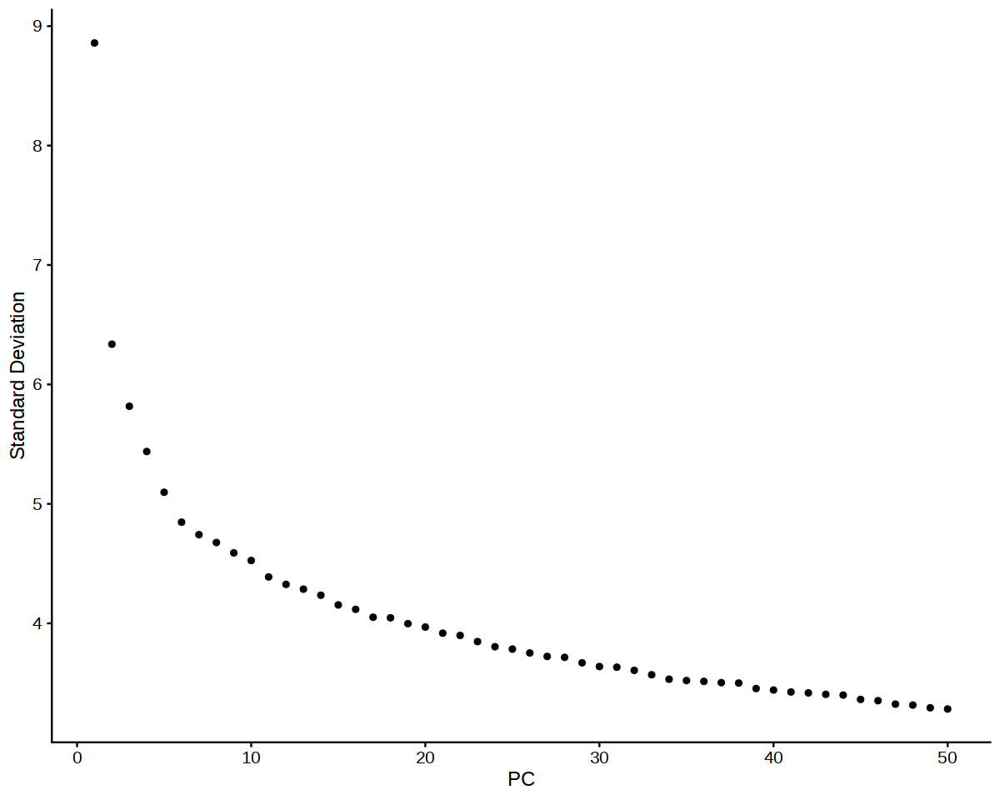

In [67]:
ElbowPlot(A_chondrocytes, 50)

In [68]:
A_chondrocytes <- FindNeighbors(A_chondrocytes, dims = 1:25, verbose = FALSE)
A_chondrocytes <- FindClusters(A_chondrocytes, resolution = 1.5, verbose = FALSE)

In [69]:
A_chondrocytes <- RunUMAP(A_chondrocytes, dims = 1:25, n.neighbors = 12, verbose = FALSE)

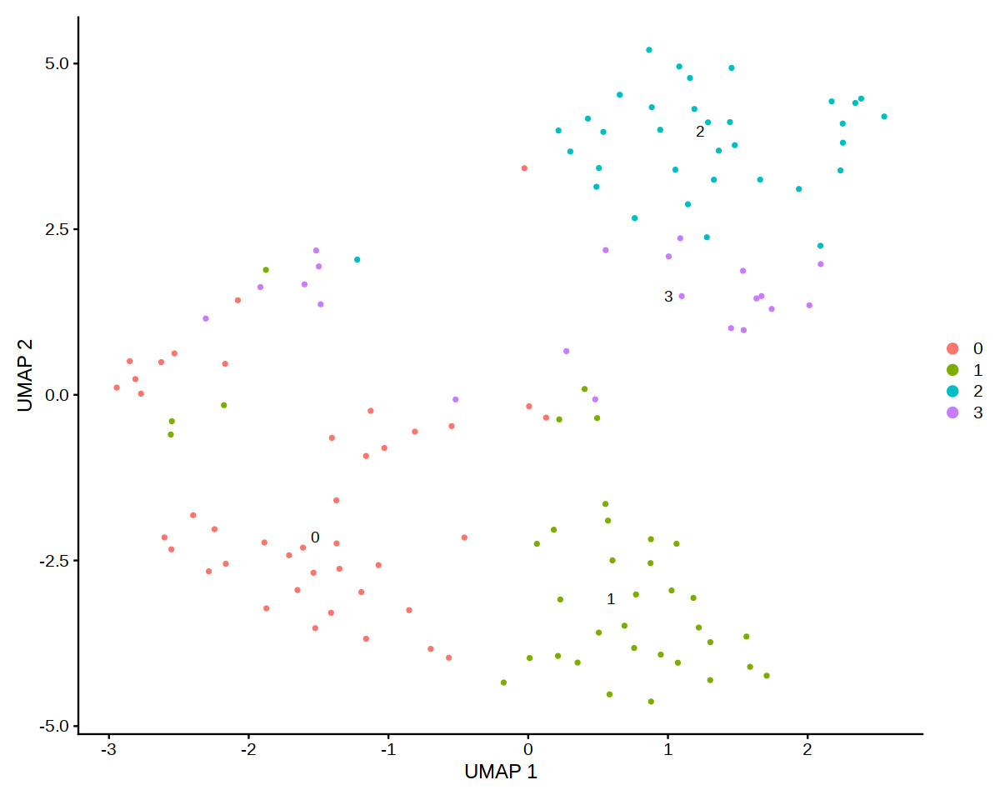

In [70]:
options(repr.plot.width = 10, repr.plot.height = 8)
DimPlot(A_chondrocytes, reduction = "umap", label=TRUE) + xlab("UMAP 1") + ylab("UMAP 2")



In [71]:
A_chondrocytes_markers <- FindAllMarkers(A_chondrocytes)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



In [99]:
write.csv(A_chondrocytes_markers, file = "A_chondrocytes.markers_e14.5.csv", quote = FALSE)

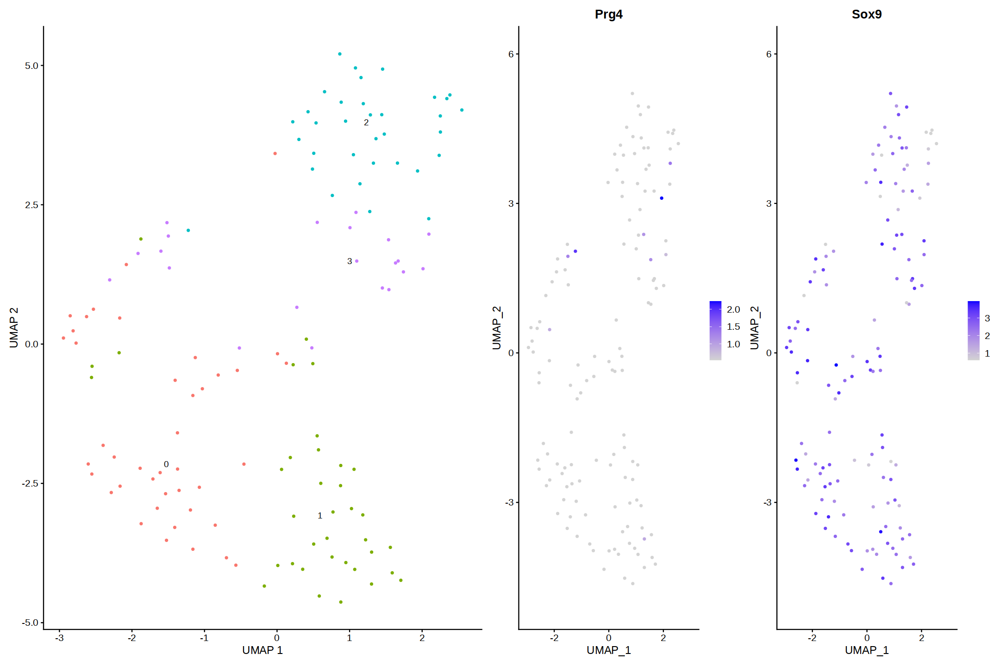

In [72]:
# Articular chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Prg4", "Sox9"), min.cutoff = "q1")  

p1 + p2

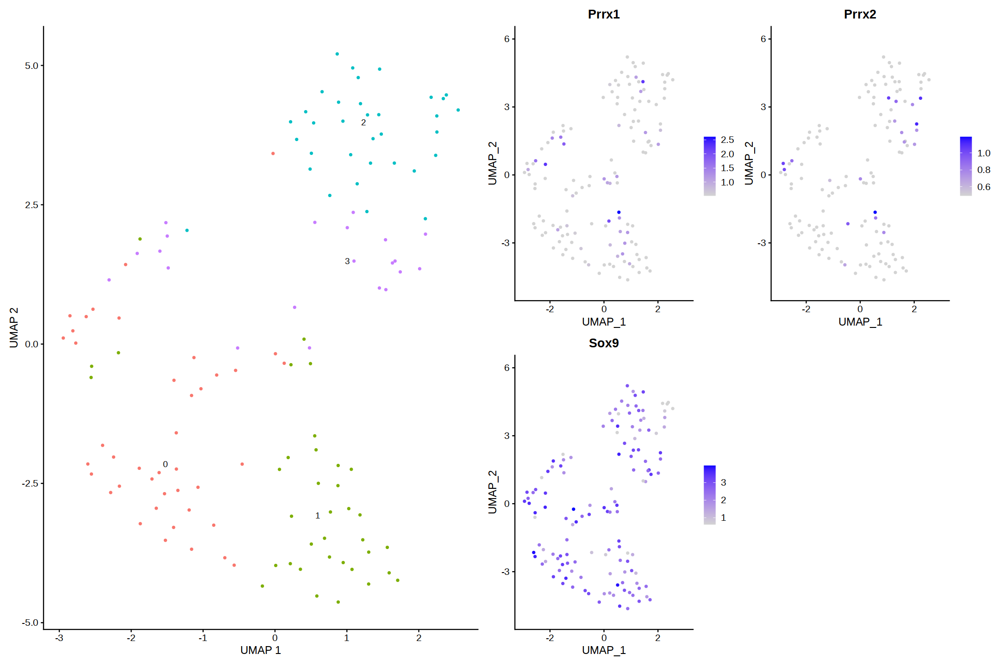

In [73]:
# Chondroprogenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Prrx1", "Prrx2", "Sox9"), min.cutoff = "q1")  

p1 + p2

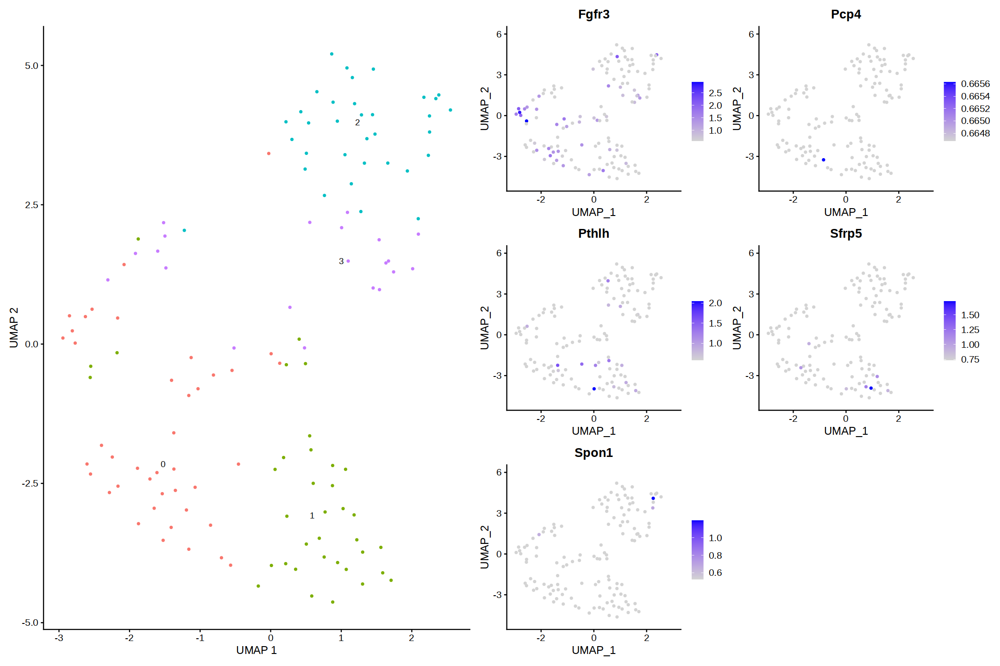

In [74]:
# Resting zone chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Fgfr3", "Pcp4", "Pthlh", "Sfrp5", "Spon1"), min.cutoff = "q1")  

p1 + p2

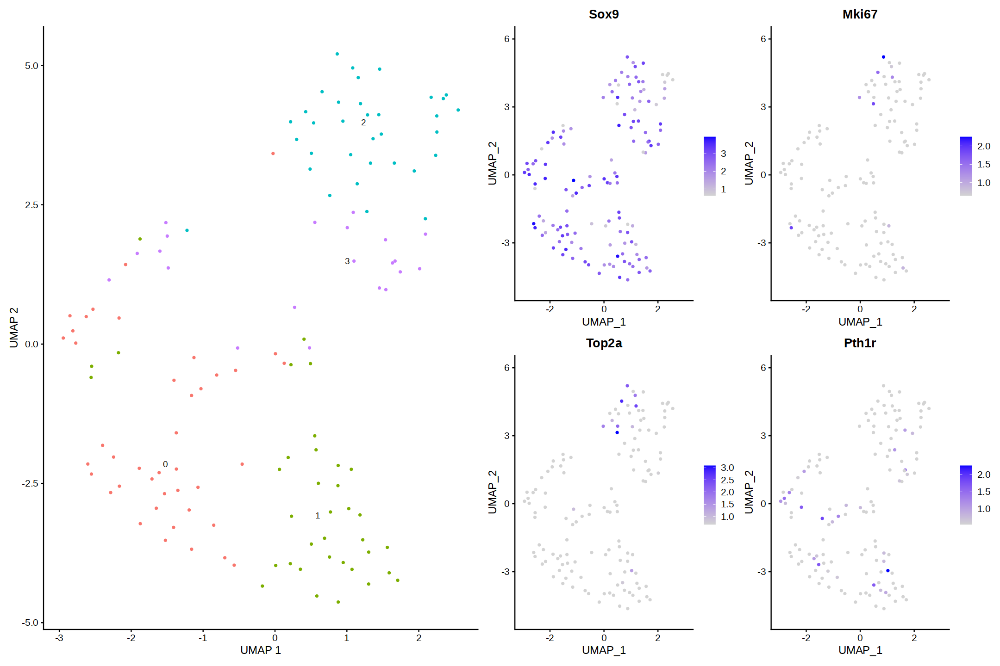

In [75]:
# Proliferative chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Sox9", "Mki67", "Top2a", "Pth1r"), min.cutoff = "q1")  

p1 + p2

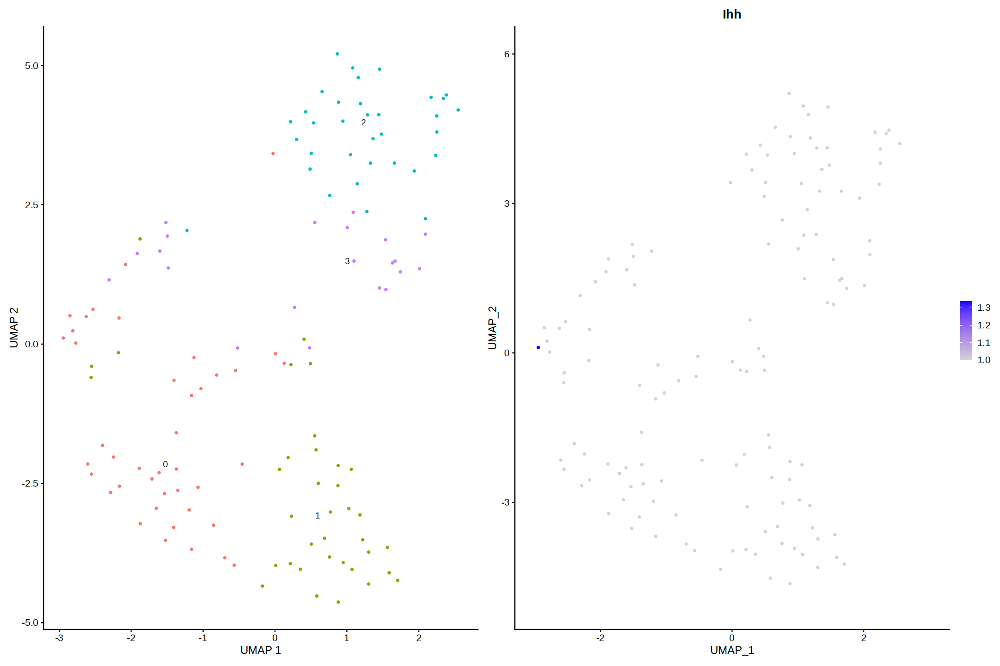

In [76]:
# Pre-hypertrophic chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Ihh"), min.cutoff = "q1")  

p1 + p2

Warning message in FeaturePlot(A_chondrocytes, c("Col10a1"), min.cutoff = "q1"):
“All cells have the same value (5.3536243809171) of Col10a1.”


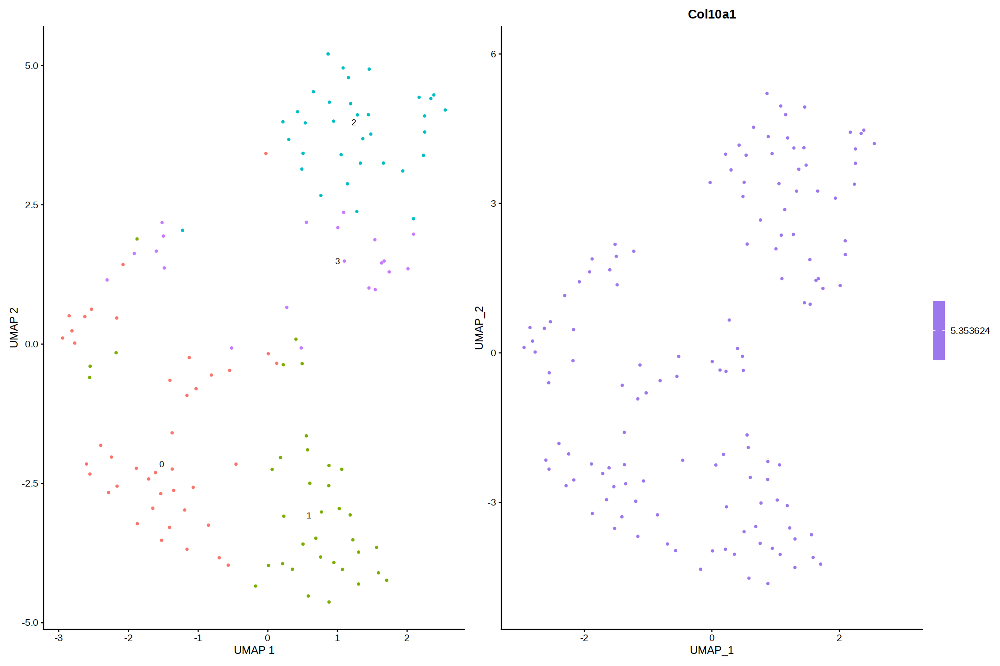

In [77]:
# hypertrophic chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Col10a1"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Adipoq”


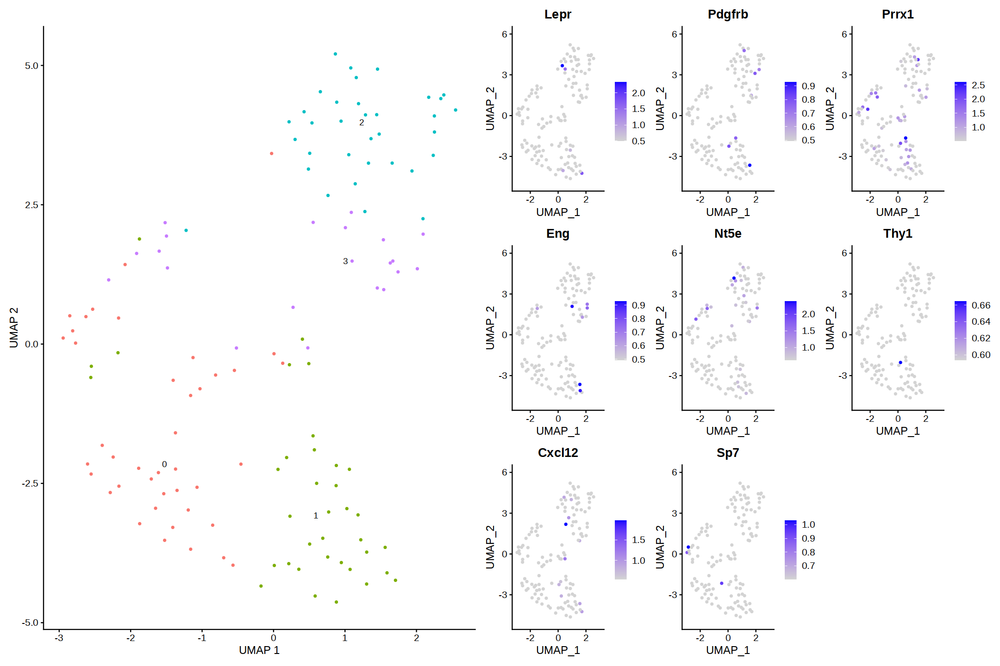

In [78]:
# SSPC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_chondrocytes, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_chondrocytes, c("Lepr","Pdgfrb",'Prrx1',"Eng", "Nt5e", "Thy1","Cxcl12","Sp7","Adipoq"), min.cutoff = "q1") 

p1 + p2

In [80]:
A_chondrocytes@meta.data$CellType_d <- Idents(A_chondrocytes)

In [81]:
A_chondrocytes@meta.data$CellType_d <- as.character(A_chondrocytes@meta.data$CellType_d)

A_chondrocytes@meta.data$CellType_d[A_chondrocytes@meta.data$CellType_d == '0'] <- 'Resting zone chondrocytes'
A_chondrocytes@meta.data$CellType_d[A_chondrocytes@meta.data$CellType_d == '1'] <- 'Resting zone chondrocytes'
A_chondrocytes@meta.data$CellType_d[A_chondrocytes@meta.data$CellType_d == '2'] <- 'Proliferative chondrocytes'
A_chondrocytes@meta.data$CellType_d[A_chondrocytes@meta.data$CellType_d == '3'] <- 'Resting zone chondrocytes'




A_chondrocytes@meta.data$CellType_d <- as.factor(A_chondrocytes@meta.data$CellType_d)

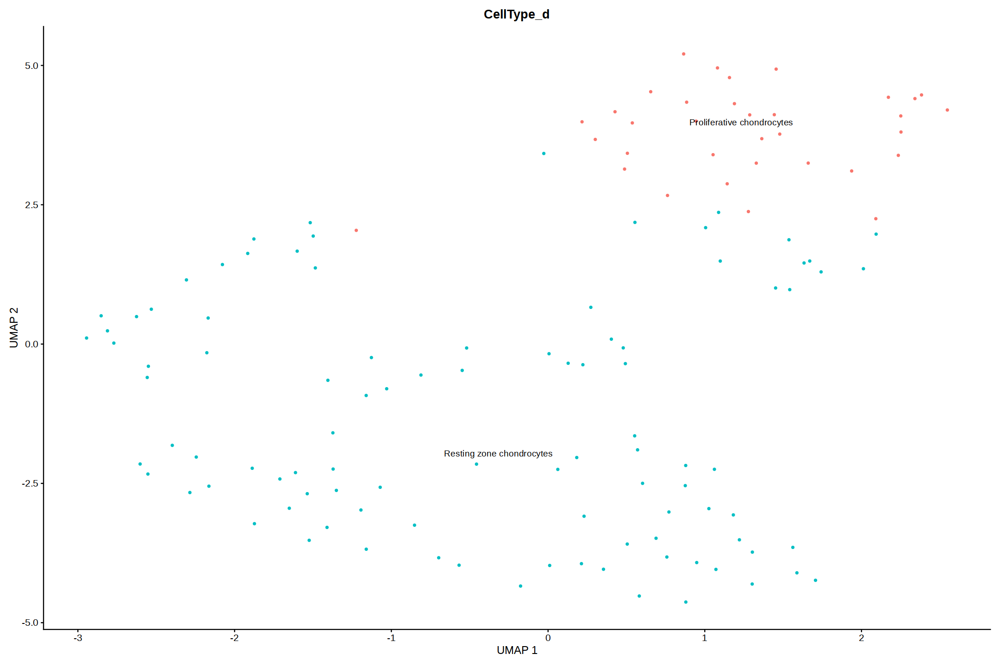

In [82]:
DimPlot(A_chondrocytes, label = TRUE, group.by="CellType_d") + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")

#### 3.4.2. Refinement of global annotations<a id="13.2"></a>
##### 3.4.2.1. Subsetting endothelial clusters<a id="14"></a>

In [80]:
A_mesenchyme <- subset(A, idents = c("Mesenchyme"))

In [81]:
A_mesenchyme

An object of class Seurat 
15429 features across 1337 samples within 1 assay 
Active assay: RNA (15429 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [82]:
A_mesenchyme <- ScaleData(A_mesenchyme)

Centering and scaling data matrix



In [83]:
A_mesenchyme <- RunPCA(A_mesenchyme, features = VariableFeatures(object = A_mesenchyme), verbose = FALSE)

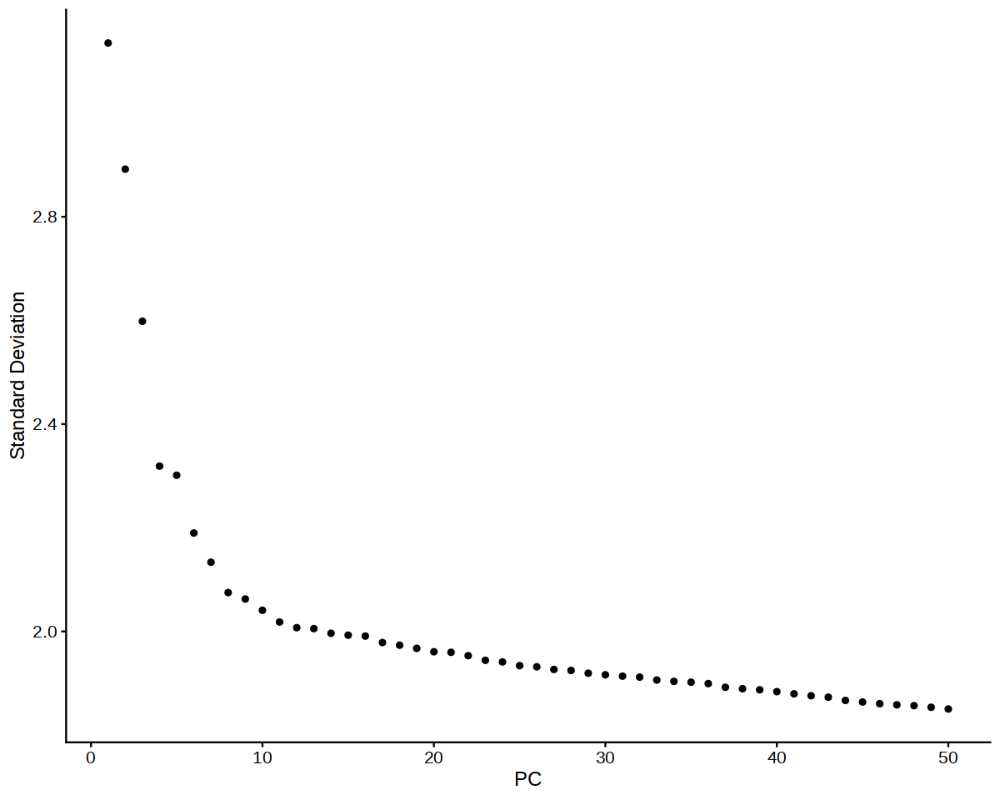

In [84]:
ElbowPlot(A_mesenchyme, 50)

In [88]:
A_mesenchyme <- FindNeighbors(A_mesenchyme, dims = 5, verbose = FALSE)
A_mesenchyme <- FindClusters(A_mesenchyme, resolution = 0.8, verbose = FALSE)

Warning message:
“Object should have two dimensions, attempting to coerce to matrix”


In [89]:
A_mesenchyme <- RunUMAP(A_mesenchyme, dims = 1:5, n.neighbors = 12, verbose = FALSE)

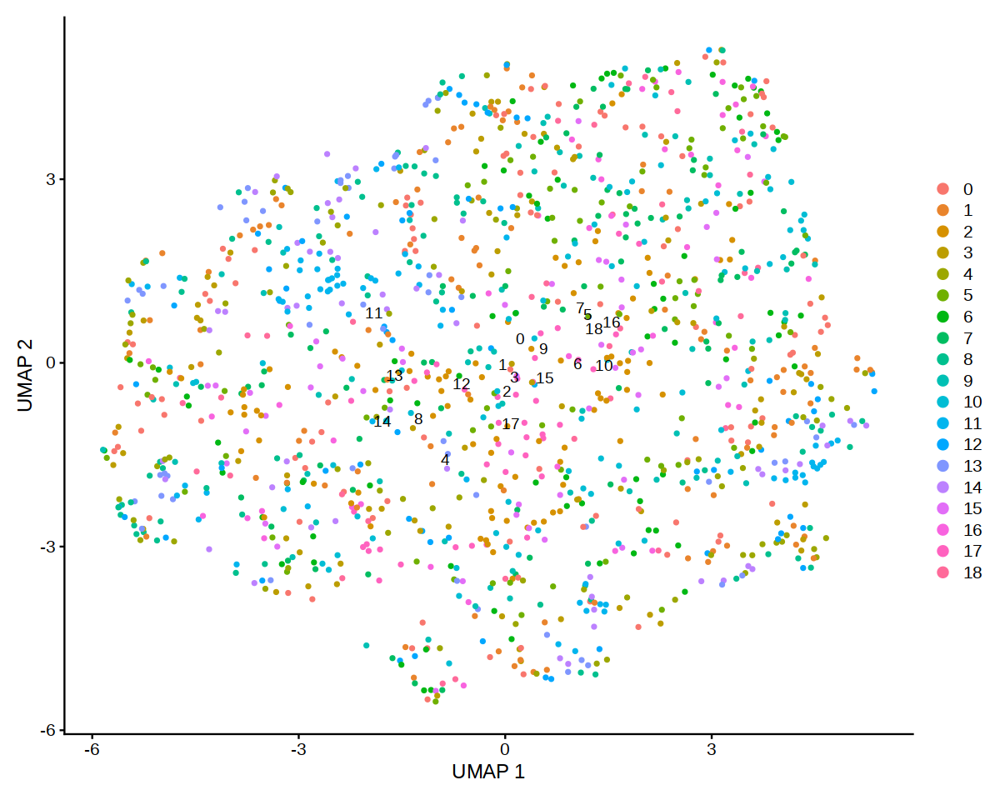

In [90]:
options(repr.plot.width = 10, repr.plot.height = 8)
DimPlot(A_mesenchyme, reduction = "umap", label=TRUE) + xlab("UMAP 1") + ylab("UMAP 2")



In [147]:
A_mesenchyme.markers <- FindAllMarkers(A_mesenchyme)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



In [148]:
write.csv(A_mesenchyme.markers, file = "A_mesenchyme_e13.5.markers.csv", quote = FALSE)

Warning message in FeaturePlot(A_mesenchyme, c("Vcam1", "Cd34", "Cd93", "Cdh5", :
“All cells have the same value (2.16175801784765) of Cd34.”
Warning message in FeaturePlot(A_mesenchyme, c("Vcam1", "Cd34", "Cd93", "Cdh5", :
“All cells have the same value (0) of Cd93.”
Warning message in FeaturePlot(A_mesenchyme, c("Vcam1", "Cd34", "Cd93", "Cdh5", :
“All cells have the same value (2.94880745714876) of Cdh5.”


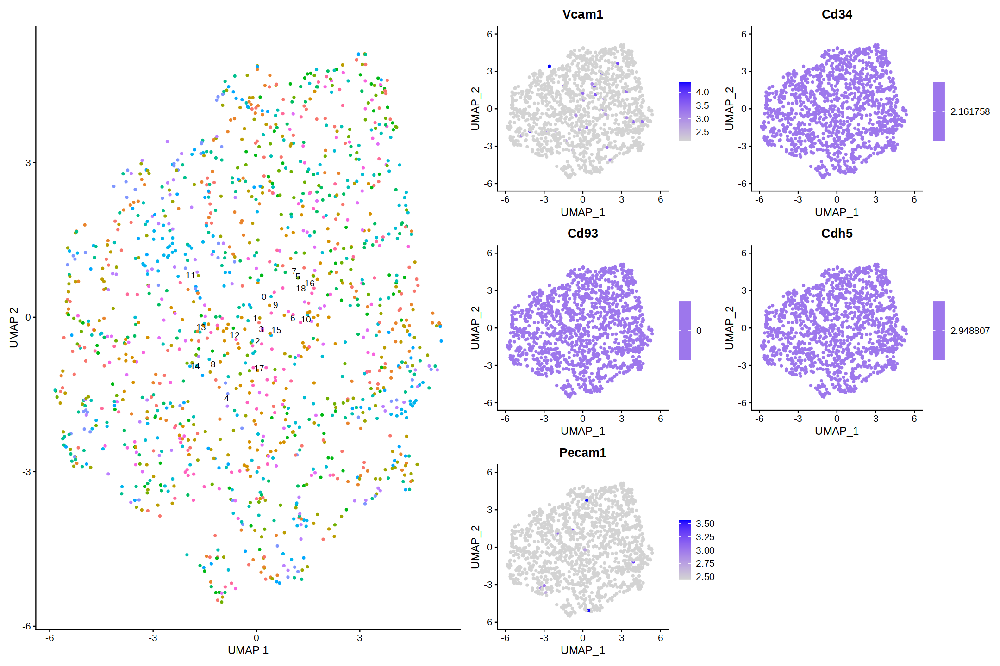

In [91]:
# Vascular endothelial cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Vcam1", "Cd34", "Cd93", "Cdh5","Pecam1"), min.cutoff = "q1")  

p1 + p2

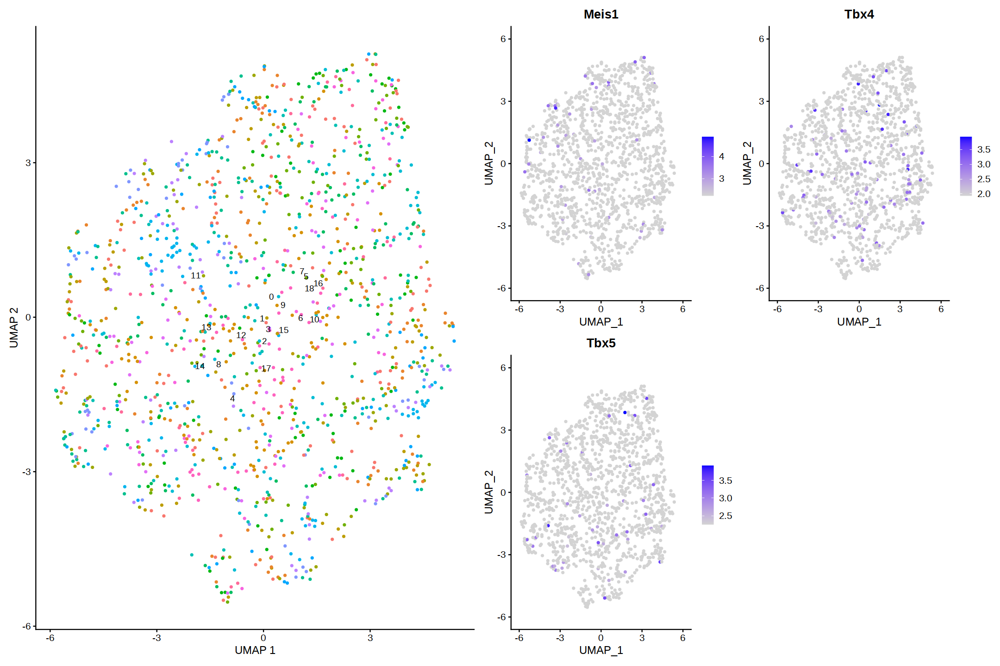

In [92]:
# Early limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Meis1", "Tbx4","Tbx5"), min.cutoff = "q1")  

p1 + p2

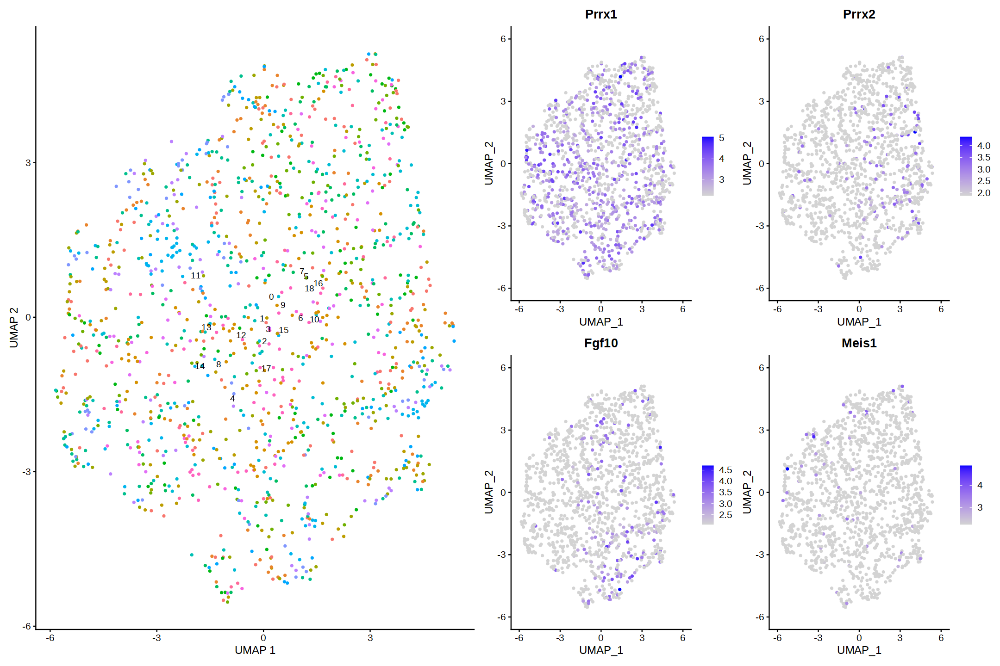

In [97]:
# limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Prrx1", "Prrx2", "Fgf10", "Meis1"), min.cutoff = "q1")  

p1 + p2

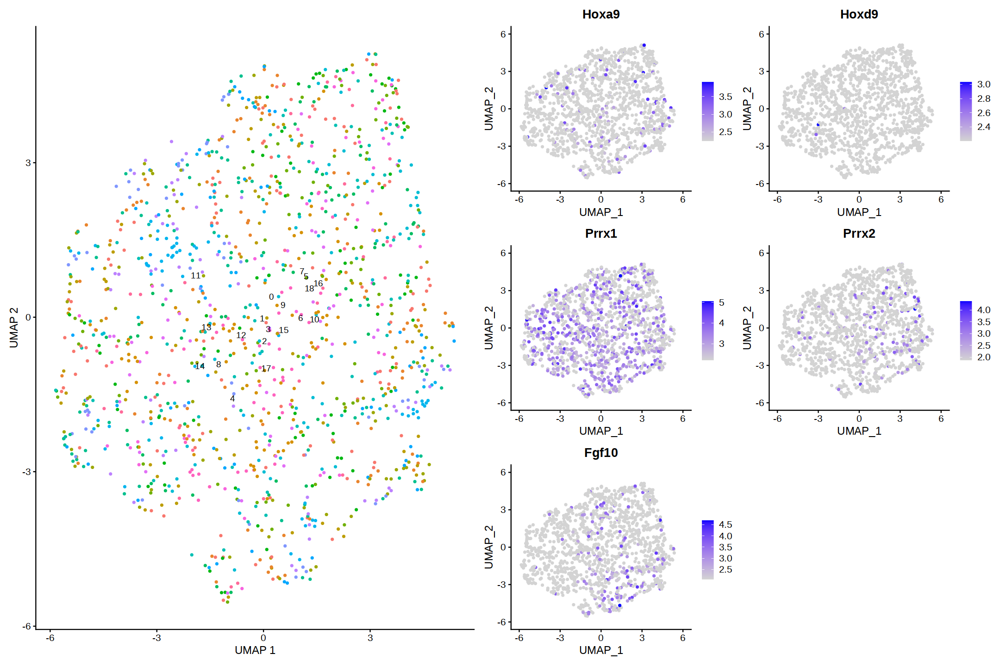

In [94]:
# prox limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Hoxa9", "Hoxd9", "Prrx1", "Prrx2", "Fgf10"), min.cutoff = "q1")  

p1 + p2

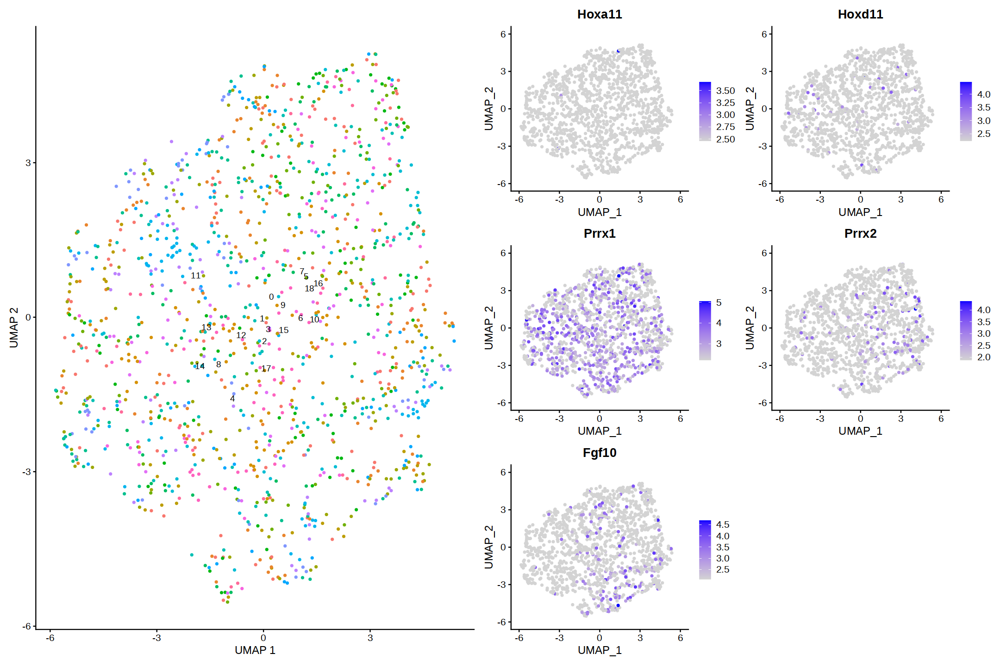

In [95]:
# intermediate limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Hoxa11", "Hoxd11", "Prrx1", "Prrx2", "Fgf10"), min.cutoff = "q1")  

p1 + p2

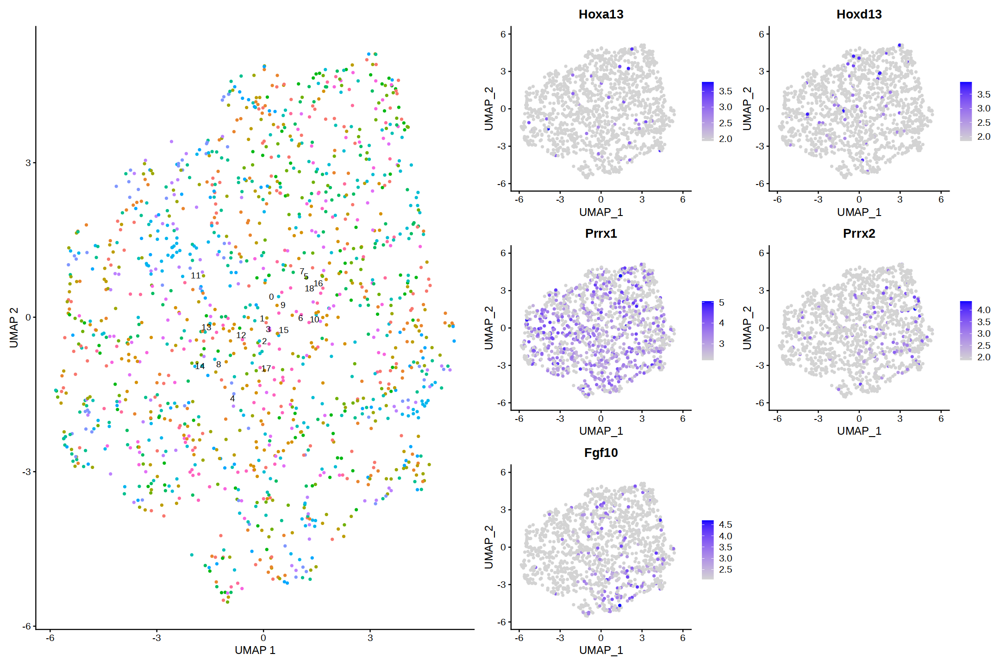

In [96]:
# distal limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Hoxa13", "Hoxd13", "Prrx1", "Prrx2", "Fgf10"), min.cutoff = "q1")  

p1 + p2

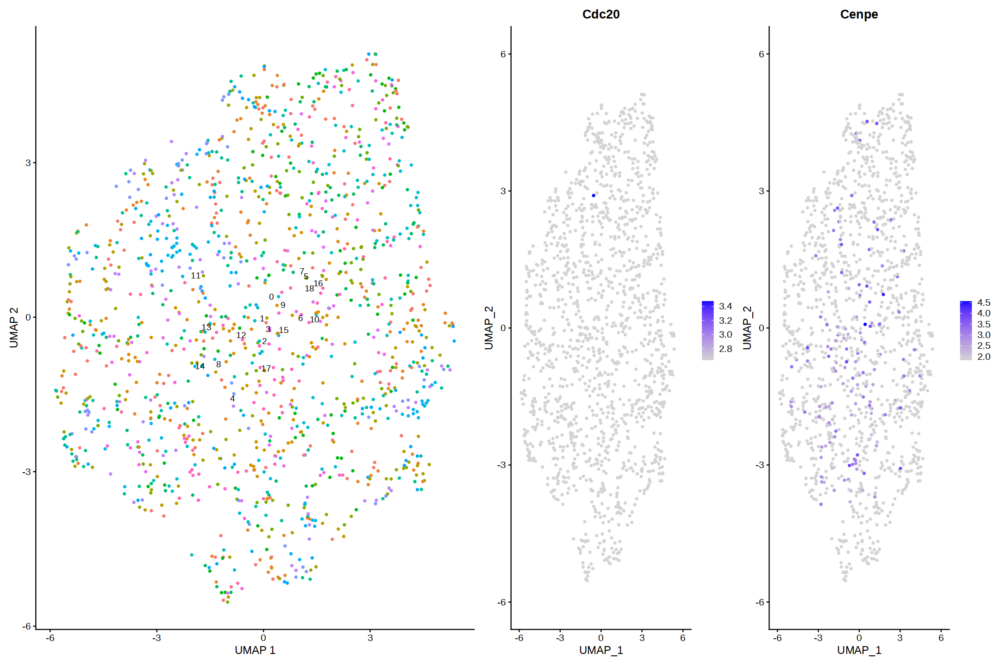

In [98]:
# fast proliferating A_mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Cdc20","Cenpe"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Thy1, Mgp”
Warning message in FeaturePlot(A_mesenchyme, c("Eng", "Nt5e", "Thy1", "Mgp", "Htra1"), :
“All cells have the same value (3.47655103233087) of Eng.”


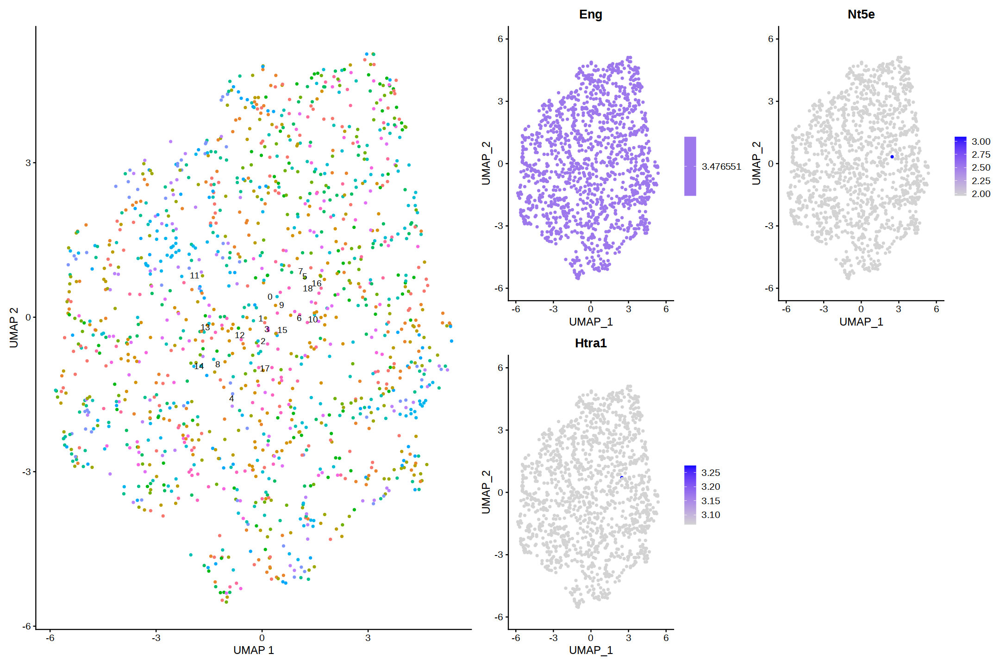

In [99]:
# BMSC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A_mesenchyme, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A_mesenchyme, c("Eng", "Nt5e", "Thy1", "Mgp","Htra1"), min.cutoff = "q1")  

p1 + p2

In [149]:
A_mesenchyme@meta.data$CellType_d <- Idents(A_mesenchyme)

In [150]:
A_mesenchyme@meta.data$CellType_d <- as.character(A_mesenchyme@meta.data$CellType_d)

A_mesenchyme@meta.data$CellType_d[A_mesenchyme@meta.data$CellType_d == '0'] <- 'Proximal limb bud mesenchyme'
A_mesenchyme@meta.data$CellType_d[A_mesenchyme@meta.data$CellType_d == '1'] <- 'Proximal limb bud mesenchyme'
A_mesenchyme@meta.data$CellType_d[A_mesenchyme@meta.data$CellType_d == '2'] <- 'Proximal limb bud mesenchyme'



A_mesenchyme@meta.data$CellType_d <- as.factor(A_mesenchyme@meta.data$CellType_d)

#### 3.4.2. Updating annotations<a id="16"></a>

In [151]:
meta1 <- A@meta.data
meta2 <- A_chondrocytes@meta.data

In [152]:
df <- split(meta1, meta1$CellType)

In [153]:
chondro <- rownames(df$Chondrocytes)

In [154]:
chondro_meta <- meta2[chondro, c("CellType_d","Author")]
chondro_meta$Author<- NULL

head(chondro_meta)

,CellType_d
,<fct>
E15.5_AAAGTAGGTAAGAGGA-1,Resting zone chondrocytes
E15.5_AACGTTGAGCCGATTT-1,Proliferative chondrocytes
E15.5_AACGTTGTCTCGTTTA-1,Resting zone chondrocytes
E15.5_AACTCTTAGAAACCAT-1,Resting zone chondrocytes
E15.5_AACTTTCTCGGTCTAA-1,Proliferative chondrocytes
E15.5_AAGGTTCGTGGTCCGT-1,Resting zone chondrocytes


In [155]:
df$Chondrocytes <- cbind(df$Chondrocytes, chondro_meta)
df$Chondrocytes$CellType <- df$Chondrocytes$CellType_d
df$Chondrocytes$CellType_d <- NULL

In [156]:
mesen <- rownames(df$Mesenchyme)

In [157]:
meta2 <- A_mesenchyme@meta.data
mesenmeta <- meta2[mesen, c("CellType_d", "Author")]
mesenmeta$Author <- NULL

head(mesenmeta)

,CellType_d
,<fct>
E15.5_AAATGCCGTAGCGCAA-1,Proximal limb bud mesenchyme
E15.5_AATCCAGGTATAGGGC-1,Proximal limb bud mesenchyme
E15.5_ACGATACTCACAATGC-1,Proximal limb bud mesenchyme
E15.5_ACTATCTCACCTATCC-1,Proximal limb bud mesenchyme
E15.5_ACTGAGTAGAGATGAG-1,Proximal limb bud mesenchyme
E15.5_AGCGTATAGACGCTTT-1,Proximal limb bud mesenchyme


In [158]:
df$Mesenchyme <- cbind(df$Mesenchyme, mesenmeta)
df$Mesenchyme$CellType <- df$Mesenchyme$CellType_d
df$Mesenchyme$CellType_d <- NULL

In [448]:
osteo <- rownames(df$Osteoblasts)

In [140]:
meta2 <- A_osteoblasts@meta.data
osteometa <- meta2[osteo, c("CellType_d", "Author")]
osteometa$Author <- NULL

head(osteometa)

ERROR: Error in eval(expr, envir, enclos): object 'A_osteoblasts' not found


In [450]:
df$Osteoblasts <- cbind(df$Osteoblasts, osteometa)
df$Osteoblasts$CellType <- df$Osteoblasts$CellType_d
df$Osteoblasts$CellType_d <- NULL

In [159]:
df$Chondrocytes$Barcode = rownames(df$Chondrocytes)

df$Mesenchyme$Barcode = rownames(df$Mesenchyme)



In [160]:
str(df)

List of 11
 $ Chondrocytes            :'data.frame':	132 obs. of  14 variables:
  ..$ nCount_RNA     : num [1:132] 1784 8426 8021 18366 6323 ...
  ..$ nFeature_RNA   : int [1:132] 998 2835 2597 4147 2295 2384 2513 2098 2604 2256 ...
  ..$ percent.mt     : num [1:132] 6.95 2.4 2.63 2.83 3.57 ...
  ..$ Age            : Factor w/ 4 levels "E12.5","E13.5",..: 4 4 4 4 4 4 4 4 4 4 ...
  ..$ Sex            : chr [1:132] "Male" "Male" "Male" "Male" ...
  ..$ Tissue         : chr [1:132] "Knee joint" "Knee joint" "Knee joint" "Knee joint" ...
  ..$ Organism       : chr [1:132] "Mus musculus" "Mus musculus" "Mus musculus" "Mus musculus" ...
  ..$ Technology     : chr [1:132] "10x" "10x" "10x" "10x" ...
  ..$ Strain         : chr [1:132] "C57BL/6J" "C57BL/6J" "C57BL/6J" "C57BL/6J" ...
  ..$ Author         : chr [1:132] "Bian" "Bian" "Bian" "Bian" ...
  ..$ RNA_snn_res.0.9: Factor w/ 12 levels "0","1","2","3",..: 6 10 10 6 10 6 6 6 6 6 ...
  ..$ seurat_clusters: Factor w/ 12 levels "0","1","2","3"

In [161]:
names(df)

[1] "Chondrocytes"             "Fast proliferating cells"
 [3] "Immune cells"             "Interzone cells"         
 [5] "Mesenchyme"               "Muscle progenitors"      
 [7] "Osteoprogenitors"         "Periosteal progenitors"  
 [9] "Periosteum"               "Skeletal muscle cells"   
[11] "Synovial fibroblasts"

In [162]:
df$`Muscle progenitors`$Barcode <- rownames(df$`Muscle progenitors`)
df$`Skeletal muscle cells`$Barcode <- rownames(df$`Skeletal muscle cells`)
df$`Immune cells`$Barcode <- rownames(df$`Immune cells`)
df$`Interzone cells`$Barcode <- rownames(df$`Interzone cells`)
df$Osteoprogenitors$Barcode <- rownames(df$Osteoprogenitors)
df$`Periosteal progenitors`$Barcode <- rownames(df$`Periosteal progenitors`)
    df$Periosteum$Barcode <- rownames(df$Periosteum)
df$`Synovial fibroblasts`$Barcode <- rownames(df$`Synovial fibroblasts`)
df$`Fast proliferating cells`$Barcode <- rownames(df$`Fast proliferating cells`)


In [163]:
meta.data <- do.call(rbind, df)
rownames(meta.data) = meta.data$Barcode
meta.data$Barcode <- NULL

In [164]:
dim(A@meta.data)
dim(meta.data)

[1] 1138   13

[1] 1138   13

In [165]:
target <- rownames(A@meta.data)
meta.data <- meta.data[match(target, rownames(meta.data)),]

In [166]:
A@meta.data = meta.data

#### 5.4.3. Finalized embedding and annotation<a id="37"></a>

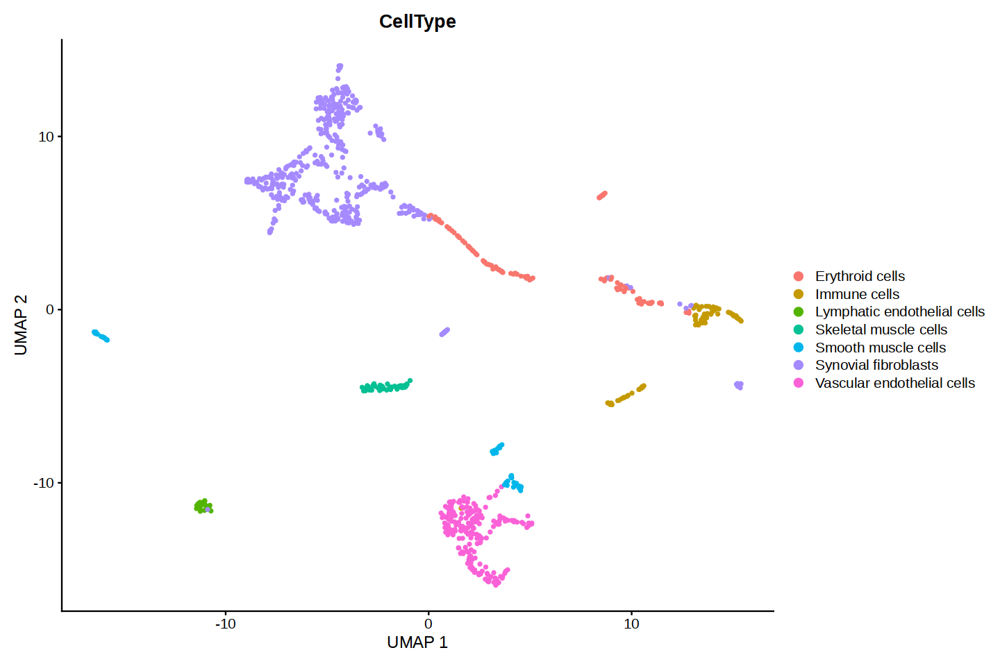

In [65]:
options(repr.plot.width=12)
DimPlot(A, group.by = "CellType", label = FALSE, repel = TRUE) + xlab("UMAP 1") + ylab("UMAP 2")


In [64]:
Idents(A) <- A$CellType

In [66]:
saveRDS(A, file = "Maerz_shamd28_annotated.Rds")